In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import shapefile
from shapely.geometry import Polygon

import squarify
import pickle
from scipy import stats
import calendar
import time
import plotly.offline as pyo
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools

from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()



In [2]:
data_types_s = \
{
'AutoID':                    'int64',
'DID' :                      'object',
'CTO' :                      'int64',
'Fleet' :                    'int64',
'MeterState' :               'int64',
'DateTimeLogged' :           'object',
'Latitude' :                 'float64',
'Longitude' :                'float64',
'GPSSpeed' :                 'int64',
'Heading' :                  'int64',
'Odometer' :                 'int64',
'MaximumSpeedMeterOff' :     'int64',
'FlagfallIncome' :           'float64',
'JobIncomeMeterOff' :        'int64',
'ExtrasIncome' :             'int64',
'DistanceIncome' :           'int64',
'WaitingIncome' :            'int64',
'MinutesSinceLastJob' :                 'int64',
'MinutesStationarySinceLastJob' :       'int64',
'JobNumber' :                           'int64',
'PaymentType' :                         'object',
'Area' :                                'int64',
'VehiclePlate' :                        'object',
'ShiftSeqNumber' :                      'int64',
'SeqNumber' :                           'int64',
'OdometerTrip' :                        'int64',
'JobWaitingTime' :                      'int64',
'JobTollsExtras' :                      'int64',
'JobPhoneUseTime' :                     'int64', 
'JobLeg' :                              'int64',
'POSautoID' :                           'int64',
'DiscountID' :                          'int64',
'Charity' :                             'int64', 
'ADMAautoID' :                          'int64',
'SharedRide' :                          'int64',
'ForeignExID' :                         'int64',

'AutoID (#1)':                    'int64',
'CTO (#1)' :                      'int64',
'Fleet (#1)' :                    'int64',
'MeterState (#1)' :               'int64',
'DateTimeLogged (#1)' :           'object',
'Latitude (#1)' :                 'float64',
'Longitude (#1)' :                'float64',
'GPSSpeed (#1)' :                 'int64',
'Heading (#1)' :                  'int64',
'Odometer (#1)' :                 'int64',
'MaximumSpeedMeterOff (#1)' :     'int64',
'FlagfallIncome (#1)' :           'float64',
'JobIncomeMeterOff (#1)' :        'float64',
'ExtrasIncome (#1)' :             'float64',
'DistanceIncome (#1)' :           'float64',
'WaitingIncome (#1)' :            'float64',
'MinutesSinceLastJob (#1)' :                 'int64',
'MinutesStationarySinceLastJob (#1)' :       'int64',
'JobNumber (#1)' :                           'int64',
'PaymentType (#1)' :                         'object',
'Area (#1)' :                                'int64',
'VehiclePlate (#1)' :                        'object',

'OdometerTrip (#1)' :                        'int64',
'JobWaitingTime (#1)' :                      'int64',
'JobTollsExtras (#1)' :                      'int64',
'JobPhoneUseTime (#1)' :                     'int64', 
'JobLeg (#1)' :                              'int64',
'POSautoID (#1)' :                           'int64',
'DiscountID (#1)' :                          'int64',
'Charity (#1)' :                             'int64', 
'ADMAautoID (#1)' :                          'int64',
'SharedRide (#1)' :                          'int64',
'ForeignExID (#1)' :                         'int64'

    

}

In [3]:
data_full=pd.read_csv('trips_2021_full.csv',dtype=data_types_s)

In [4]:
pd.set_option('display.max_columns', None)
data_full.head()

,AutoID,DID,CTO,Fleet,MeterState,DateTimeLogged,Latitude,Longitude,GPSSpeed,Heading,Odometer,MaximumSpeedMeterOff,FlagfallIncome,JobIncomeMeterOff,ExtrasIncome,DistanceIncome,WaitingIncome,MinutesSinceLastJob,MinutesStationarySinceLastJob,JobNumber,PaymentType,Area,VehiclePlate,ShiftSeqNumber,SeqNumber,OdometerTrip,JobWaitingTime,JobTollsExtras,JobPhoneUseTime,JobLeg,POSautoID,DiscountID,Charity,ADMAautoID,SharedRide,ForeignExID,AutoID (#1),CTO (#1),Fleet (#1),MeterState (#1),DateTimeLogged (#1),Latitude (#1),Longitude (#1),GPSSpeed (#1),Heading (#1),Odometer (#1),MaximumSpeedMeterOff (#1),FlagfallIncome (#1),JobIncomeMeterOff (#1),ExtrasIncome (#1),DistanceIncome (#1),WaitingIncome (#1),MinutesSinceLastJob (#1),MinutesStationarySinceLastJob (#1),JobNumber (#1),PaymentType (#1),Area (#1),VehiclePlate (#1),OdometerTrip (#1),JobWaitingTime (#1),JobTollsExtras (#1),JobPhoneUseTime (#1),JobLeg (#1),POSautoID (#1),DiscountID (#1),Charity (#1),ADMAautoID (#1),SharedRide (#1),ForeignExID (#1)
0,1644627446,0002130520,9734,1,1,2021-01-01T01:29:28.0,25.070868,55.139423,4,34,301065,111,5.5,0,0,0,0,0,0,0,$,114,DA560,2151,18,0,0,0,0,1,0,0,0,0,0,0,1644635647,9734,1,0,2021-01-01T01:45:36.0,25.077242,55.134895,0,26,307655,111,0.0,21.5,0.0,12.0,4.0,0,0,0,$,116,DA560,6590,0,0,0,1,0,0,0,0,0,0
1,1644627449,0002150283,2040,1,1,2021-01-01T01:29:28.0,25.193027,55.265594,12,30,278098,115,5.5,0,0,0,0,0,0,0,$,82,DW089,209,15,0,0,0,0,1,0,0,0,0,0,0,1644635574,2040,1,0,2021-01-01T01:45:28.0,25.083443,55.147810,0,0,298039,115,0.0,44.0,0.0,37.5,1.0,0,0,0,$,115,DW089,19941,0,4,0,1,0,0,0,0,0,0
2,1644627451,0002171760,9887,1,1,2021-01-01T01:29:28.0,25.201374,55.277050,0,0,390316,116,5.5,0,0,0,0,0,0,0,$,82,XB773,679,24,0,0,0,0,1,0,0,0,0,0,0,1644634227,9887,1,0,2021-01-01T01:42:58.0,25.187576,55.260937,0,0,399373,116,0.0,25.0,0.0,16.5,3.0,0,0,0,$,83,XB773,9057,0,0,0,1,0,0,0,0,0,0
3,1644627452,0002191605,1441,1,1,2021-01-01T01:29:28.0,25.210170,55.260292,10,116,291592,99,9.0,0,0,0,0,0,0,75150568,$,262,XA160,2327,22,0,0,0,0,1,0,0,0,0,0,0,1644631289,1441,1,0,2021-01-01T01:37:06.0,25.180582,55.247160,0,0,296516,99,0.0,18.5,0.0,9.0,0.5,0,0,75150568,$,91,XA160,4924,0,0,0,1,0,0,0,9372766,0,0
4,1644627459,0002171389,1995,1,1,2021-01-01T01:29:29.0,25.275724,55.312176,16,60,228307,93,5.5,0,0,0,0,0,0,0,$,41,XA986,1778,35,0,0,0,0,1,0,0,0,0,0,0,1644632142,1995,1,0,2021-01-01T01:38:49.0,25.267828,55.354942,0,0,233932,93,0.0,17.0,0.0,10.5,1.0,0,0,0,$,36,XA986,5625,0,0,0,1,0,0,0,0,0,0


In [5]:
pd.set_option('display.max_columns', None)
data_full.tail()

,AutoID,DID,CTO,Fleet,MeterState,DateTimeLogged,Latitude,Longitude,GPSSpeed,Heading,Odometer,MaximumSpeedMeterOff,FlagfallIncome,JobIncomeMeterOff,ExtrasIncome,DistanceIncome,WaitingIncome,MinutesSinceLastJob,MinutesStationarySinceLastJob,JobNumber,PaymentType,Area,VehiclePlate,ShiftSeqNumber,SeqNumber,OdometerTrip,JobWaitingTime,JobTollsExtras,JobPhoneUseTime,JobLeg,POSautoID,DiscountID,Charity,ADMAautoID,SharedRide,ForeignExID,AutoID (#1),CTO (#1),Fleet (#1),MeterState (#1),DateTimeLogged (#1),Latitude (#1),Longitude (#1),GPSSpeed (#1),Heading (#1),Odometer (#1),MaximumSpeedMeterOff (#1),FlagfallIncome (#1),JobIncomeMeterOff (#1),ExtrasIncome (#1),DistanceIncome (#1),WaitingIncome (#1),MinutesSinceLastJob (#1),MinutesStationarySinceLastJob (#1),JobNumber (#1),PaymentType (#1),Area (#1),VehiclePlate (#1),OdometerTrip (#1),JobWaitingTime (#1),JobTollsExtras (#1),JobPhoneUseTime (#1),JobLeg (#1),POSautoID (#1),DiscountID (#1),Charity (#1),ADMAautoID (#1),SharedRide (#1),ForeignExID (#1)
8124344,1657798923,0002200476,9846,1,1,2021-01-31T08:45:18.0,25.277290,55.353012,4,0,14567,82,5.0,0,0,0,0,0,0,0,$,36,XA193,2464,1,0,0,0,0,1,0,0,0,0,0,0,1657819779,9846,1,0,2021-01-31T09:34:44.0,25.187683,55.377945,0,0,44630,82,0.0,73.0,0.0,56.5,11.5,0,0,0,$,18,XA193,30063,0,0,0,1,0,0,0,0,0,0
8124345,1657798925,0002162186,1554,1,1,2021-01-31T08:45:18.0,25.202984,55.279110,3,8,129530,118,5.0,0,0,0,0,0,0,0,$,69,DW107,171,2,0,0,0,0,1,0,0,0,0,0,0,1657805835,1554,1,0,2021-01-31T09:00:56.0,25.097948,55.163390,0,0,149766,118,0.0,43.5,0.0,38.0,0.5,0,0,0,C,105,DW107,20236,0,8,0,1,49893054,0,0,0,0,0
8124346,1657798929,0002200339,4897,1,1,2021-01-31T08:45:17.0,25.095737,55.153410,0,0,90382,83,12.0,0,0,0,0,0,0,76029070,$,105,HTD659,2633,5,0,0,0,0,1,0,0,0,0,0,0,1657805936,4897,1,0,2021-01-31T09:01:07.0,25.213690,55.279860,0,0,110161,83,0.0,50.0,0.0,37.0,1.0,0,0,76029070,$,71,HTD659,19779,0,8,0,1,0,0,0,10077045,0,0
8124347,1657798932,0002200515,2512,1,1,2021-01-31T08:45:18.0,25.031557,55.150173,0,0,34604,118,12.0,0,0,0,0,0,0,76028947,$,118,HTD893,1250,2,0,0,0,0,1,0,0,0,0,0,0,1657806453,2512,1,0,2021-01-31T09:02:19.0,25.126787,55.208473,0,0,53136,118,0.0,49.0,0.0,35.0,2.0,0,0,76028947,$,99,HTD893,18532,0,4,0,1,0,0,0,10077082,0,0
8124348,1657798933,0002201321,891,1,1,2021-01-31T08:45:19.0,25.300745,55.383160,6,250,55197,95,5.0,0,0,0,0,0,0,0,$,27,DS221,276,2,0,0,0,0,1,0,0,0,0,0,0,1657805242,891,1,0,2021-01-31T08:59:42.0,25.267141,55.394917,0,0,62647,95,0.0,21.5,0.0,14.0,2.5,0,0,0,$,30,DS221,7450,0,0,0,1,0,0,0,0,0,0


In [6]:
data_full.columns
new_columns=['AutoID', 'DID', 'CTO', 'Fleet', 'MeterState', 'DateTimeLogged',
       'Latitude', 'Longitude', 'GPSSpeed', 'Heading', 'Odometer',
       'MaximumSpeedMeterOff', 'FlagfallIncome', 'JobIncomeMeterOff',
       'ExtrasIncome', 'DistanceIncome', 'WaitingIncome',
       'MinutesSinceLastJob', 'MinutesStationarySinceLastJob', 'JobNumber',
       'PaymentType', 'Area', 'VehiclePlate', 'ShiftSeqNumber', 'SeqNumber',
       'OdometerTrip', 'JobWaitingTime', 'JobTollsExtras', 'JobPhoneUseTime',
       'JobLeg', 'POSautoID', 'DiscountID', 'Charity', 'ADMAautoID',
       'SharedRide', 'ForeignExID', 'AutoID (#1)', 'CTO (#1)', 'Fleet (#1)',
       'MeterState (#1)', 'DropoffDatetime', 'DropoffLatitude',
       'DropoffLongitude', 'GPSSpeed (#1)', 'Heading (#1)', 'Odometer (#1)',
       'MaximumSpeedMeterOff (#1)', 'FlagfallIncome (#1)',
       'TotalFare', 'ExtrasIncome (#1)', 'DistFare',
       'WaitFare', 'MinutesSinceLastJob (#1)',
       'MinutesStationarySinceLastJob (#1)', 'JobNumber (#1)',
       'PaymentType (#1)', 'DropoffArea', 'VehiclePlate (#1)',
       'TripDistance', 'JobWaitingTime (#1)', 'JobTollsExtras (#1)',
       'JobPhoneUseTime (#1)', 'JobLeg (#1)', 'POSautoID (#1)',
       'DiscountID (#1)', 'Charity (#1)', 'ADMAautoID (#1)', 'SharedRide (#1)',
       'ForeignExID (#1)']
data_full=data_full.rename(columns=dict(zip(data_full.columns,new_columns)))
# data_10=data_10.rename(columns=dict(zip(data_10.columns,new_columns)))
data_full.head()

,AutoID,DID,CTO,Fleet,MeterState,DateTimeLogged,Latitude,Longitude,GPSSpeed,Heading,Odometer,MaximumSpeedMeterOff,FlagfallIncome,JobIncomeMeterOff,ExtrasIncome,DistanceIncome,WaitingIncome,MinutesSinceLastJob,MinutesStationarySinceLastJob,JobNumber,PaymentType,Area,VehiclePlate,ShiftSeqNumber,SeqNumber,OdometerTrip,JobWaitingTime,JobTollsExtras,JobPhoneUseTime,JobLeg,POSautoID,DiscountID,Charity,ADMAautoID,SharedRide,ForeignExID,AutoID (#1),CTO (#1),Fleet (#1),MeterState (#1),DropoffDatetime,DropoffLatitude,DropoffLongitude,GPSSpeed (#1),Heading (#1),Odometer (#1),MaximumSpeedMeterOff (#1),FlagfallIncome (#1),TotalFare,ExtrasIncome (#1),DistFare,WaitFare,MinutesSinceLastJob (#1),MinutesStationarySinceLastJob (#1),JobNumber (#1),PaymentType (#1),DropoffArea,VehiclePlate (#1),TripDistance,JobWaitingTime (#1),JobTollsExtras (#1),JobPhoneUseTime (#1),JobLeg (#1),POSautoID (#1),DiscountID (#1),Charity (#1),ADMAautoID (#1),SharedRide (#1),ForeignExID (#1)
0,1644627446,0002130520,9734,1,1,2021-01-01T01:29:28.0,25.070868,55.139423,4,34,301065,111,5.5,0,0,0,0,0,0,0,$,114,DA560,2151,18,0,0,0,0,1,0,0,0,0,0,0,1644635647,9734,1,0,2021-01-01T01:45:36.0,25.077242,55.134895,0,26,307655,111,0.0,21.5,0.0,12.0,4.0,0,0,0,$,116,DA560,6590,0,0,0,1,0,0,0,0,0,0
1,1644627449,0002150283,2040,1,1,2021-01-01T01:29:28.0,25.193027,55.265594,12,30,278098,115,5.5,0,0,0,0,0,0,0,$,82,DW089,209,15,0,0,0,0,1,0,0,0,0,0,0,1644635574,2040,1,0,2021-01-01T01:45:28.0,25.083443,55.147810,0,0,298039,115,0.0,44.0,0.0,37.5,1.0,0,0,0,$,115,DW089,19941,0,4,0,1,0,0,0,0,0,0
2,1644627451,0002171760,9887,1,1,2021-01-01T01:29:28.0,25.201374,55.277050,0,0,390316,116,5.5,0,0,0,0,0,0,0,$,82,XB773,679,24,0,0,0,0,1,0,0,0,0,0,0,1644634227,9887,1,0,2021-01-01T01:42:58.0,25.187576,55.260937,0,0,399373,116,0.0,25.0,0.0,16.5,3.0,0,0,0,$,83,XB773,9057,0,0,0,1,0,0,0,0,0,0
3,1644627452,0002191605,1441,1,1,2021-01-01T01:29:28.0,25.210170,55.260292,10,116,291592,99,9.0,0,0,0,0,0,0,75150568,$,262,XA160,2327,22,0,0,0,0,1,0,0,0,0,0,0,1644631289,1441,1,0,2021-01-01T01:37:06.0,25.180582,55.247160,0,0,296516,99,0.0,18.5,0.0,9.0,0.5,0,0,75150568,$,91,XA160,4924,0,0,0,1,0,0,0,9372766,0,0
4,1644627459,0002171389,1995,1,1,2021-01-01T01:29:29.0,25.275724,55.312176,16,60,228307,93,5.5,0,0,0,0,0,0,0,$,41,XA986,1778,35,0,0,0,0,1,0,0,0,0,0,0,1644632142,1995,1,0,2021-01-01T01:38:49.0,25.267828,55.354942,0,0,233932,93,0.0,17.0,0.0,10.5,1.0,0,0,0,$,36,XA986,5625,0,0,0,1,0,0,0,0,0,0


In [7]:
meta_all=\
{
'AutoID':                    'int64',
'DID' :                      'object',
'CTO' :                      'int64',
'Fleet' :                    'int64',
'MeterState' :               'int64',
'DateTimeLogged' :           'datetime64[ns]',
'Latitude' :                 'float64',
'Longitude' :                'float64',
'GPSSpeed' :                 'int64',
'Heading' :                  'int64',
'Odometer' :                 'int64',
'MaximumSpeedMeterOff' :     'int64',
'FlagfallIncome' :           'float64',
'JobIncomeMeterOff' :        'int64',
'ExtrasIncome' :             'int64',
'DistanceIncome' :           'int64',
'WaitingIncome' :            'int64',
'MinutesSinceLastJob' :                 'int64',
'MinutesStationarySinceLastJob' :       'int64',
'JobNumber' :                           'int64',
'PaymentType' :                         'object',
'Area' :                                'int64',
'VehiclePlate' :                        'object',
'ShiftSeqNumber' :                      'int64',
'SeqNumber' :                           'int64',
'OdometerTrip' :                        'int64',
'JobWaitingTime' :                      'int64',
'JobTollsExtras' :                      'int64',
'JobPhoneUseTime' :                     'int64', 
'JobLeg' :                              'int64',
'POSautoID' :                           'int64',
'DiscountID' :                          'int64',
'Charity' :                             'int64', 
'ADMAautoID' :                          'int64',
'SharedRide' :                          'int64',
'ForeignExID' :                         'int64',

'AutoID (#1)':                    'int64',

'CTO (#1)' :                      'int64',
'Fleet (#1)' :                    'int64',
'MeterState (#1)' :               'int64',
'DropoffDatetime' :           'datetime64[ns]',
'DropoffLatitude' :                 'float64',
'DropoffLongitude' :                'float64',
'GPSSpeed (#1)' :                 'int64',
'Heading (#1)' :                  'int64',
'Odometer (#1)' :                 'int64',
'MaximumSpeedMeterOff (#1)' :     'int64',
'FlagfallIncome (#1)' :           'float64',
'TotalFare' :        'float64',
'ExtrasIncome (#1)' :             'float64',
'DistFare' :           'float64',
'WaitFare' :            'float64',
'MinutesSinceLastJob (#1)' :                 'int64',
'MinutesStationarySinceLastJob (#1)' :       'int64',
'JobNumber (#1)' :                           'int64',
'PaymentType (#1)' :                         'object',
'DropoffArea' :                                'int64',
'VehiclePlate (#1)' :                        'object',

'TripDistance' :                        'int64',
'JobWaitingTime (#1)' :                      'int64',
'JobTollsExtras (#1)' :                      'int64',
'JobPhoneUseTime (#1)' :                     'int64', 
'JobLeg (#1)' :                              'int64',
'POSautoID (#1)' :                           'int64',
'DiscountID (#1)' :                          'int64',
'Charity (#1)' :                             'int64', 
'ADMAautoID (#1)' :                          'int64',
'SharedRide (#1)' :                          'int64',
'ForeignExID (#1)' :                         'int64'
}

In [8]:
#converting to data type
def change_dates(df):
    df = df.assign(DateTimeLogged=pd.to_datetime(df['DateTimeLogged'], format="%Y-%m-%dT%H:%M:%S.0"))
    df = df.assign(DropoffDatetime=pd.to_datetime(df['DropoffDatetime'], format="%Y-%m-%dT%H:%M:%S.0"))
    return df

data_full=change_dates(data_full)


In [9]:
data_full.head()

,AutoID,DID,CTO,Fleet,MeterState,DateTimeLogged,Latitude,Longitude,GPSSpeed,Heading,Odometer,MaximumSpeedMeterOff,FlagfallIncome,JobIncomeMeterOff,ExtrasIncome,DistanceIncome,WaitingIncome,MinutesSinceLastJob,MinutesStationarySinceLastJob,JobNumber,PaymentType,Area,VehiclePlate,ShiftSeqNumber,SeqNumber,OdometerTrip,JobWaitingTime,JobTollsExtras,JobPhoneUseTime,JobLeg,POSautoID,DiscountID,Charity,ADMAautoID,SharedRide,ForeignExID,AutoID (#1),CTO (#1),Fleet (#1),MeterState (#1),DropoffDatetime,DropoffLatitude,DropoffLongitude,GPSSpeed (#1),Heading (#1),Odometer (#1),MaximumSpeedMeterOff (#1),FlagfallIncome (#1),TotalFare,ExtrasIncome (#1),DistFare,WaitFare,MinutesSinceLastJob (#1),MinutesStationarySinceLastJob (#1),JobNumber (#1),PaymentType (#1),DropoffArea,VehiclePlate (#1),TripDistance,JobWaitingTime (#1),JobTollsExtras (#1),JobPhoneUseTime (#1),JobLeg (#1),POSautoID (#1),DiscountID (#1),Charity (#1),ADMAautoID (#1),SharedRide (#1),ForeignExID (#1)
0,1644627446,0002130520,9734,1,1,2021-01-01 01:29:28,25.070868,55.139423,4,34,301065,111,5.5,0,0,0,0,0,0,0,$,114,DA560,2151,18,0,0,0,0,1,0,0,0,0,0,0,1644635647,9734,1,0,2021-01-01 01:45:36,25.077242,55.134895,0,26,307655,111,0.0,21.5,0.0,12.0,4.0,0,0,0,$,116,DA560,6590,0,0,0,1,0,0,0,0,0,0
1,1644627449,0002150283,2040,1,1,2021-01-01 01:29:28,25.193027,55.265594,12,30,278098,115,5.5,0,0,0,0,0,0,0,$,82,DW089,209,15,0,0,0,0,1,0,0,0,0,0,0,1644635574,2040,1,0,2021-01-01 01:45:28,25.083443,55.147810,0,0,298039,115,0.0,44.0,0.0,37.5,1.0,0,0,0,$,115,DW089,19941,0,4,0,1,0,0,0,0,0,0
2,1644627451,0002171760,9887,1,1,2021-01-01 01:29:28,25.201374,55.277050,0,0,390316,116,5.5,0,0,0,0,0,0,0,$,82,XB773,679,24,0,0,0,0,1,0,0,0,0,0,0,1644634227,9887,1,0,2021-01-01 01:42:58,25.187576,55.260937,0,0,399373,116,0.0,25.0,0.0,16.5,3.0,0,0,0,$,83,XB773,9057,0,0,0,1,0,0,0,0,0,0
3,1644627452,0002191605,1441,1,1,2021-01-01 01:29:28,25.210170,55.260292,10,116,291592,99,9.0,0,0,0,0,0,0,75150568,$,262,XA160,2327,22,0,0,0,0,1,0,0,0,0,0,0,1644631289,1441,1,0,2021-01-01 01:37:06,25.180582,55.247160,0,0,296516,99,0.0,18.5,0.0,9.0,0.5,0,0,75150568,$,91,XA160,4924,0,0,0,1,0,0,0,9372766,0,0
4,1644627459,0002171389,1995,1,1,2021-01-01 01:29:29,25.275724,55.312176,16,60,228307,93,5.5,0,0,0,0,0,0,0,$,41,XA986,1778,35,0,0,0,0,1,0,0,0,0,0,0,1644632142,1995,1,0,2021-01-01 01:38:49,25.267828,55.354942,0,0,233932,93,0.0,17.0,0.0,10.5,1.0,0,0,0,$,36,XA986,5625,0,0,0,1,0,0,0,0,0,0


In [10]:
data_full[["DateTimeLogged", "DropoffDatetime"]].max()

DateTimeLogged    2021-03-31 23:56:42
DropoffDatetime   2021-03-31 23:59:54
dtype: datetime64[ns]

In [11]:
data_full[["DateTimeLogged", "DropoffDatetime"]].min()

DateTimeLogged    2021-01-01 00:00:00
DropoffDatetime   2021-01-01 00:00:43
dtype: datetime64[ns]

In [12]:

data_full_final = data_full.set_index("DateTimeLogged")
data_full_final.head()

,AutoID,DID,CTO,Fleet,MeterState,Latitude,Longitude,GPSSpeed,Heading,Odometer,MaximumSpeedMeterOff,FlagfallIncome,JobIncomeMeterOff,ExtrasIncome,DistanceIncome,WaitingIncome,MinutesSinceLastJob,MinutesStationarySinceLastJob,JobNumber,PaymentType,Area,VehiclePlate,ShiftSeqNumber,SeqNumber,OdometerTrip,JobWaitingTime,JobTollsExtras,JobPhoneUseTime,JobLeg,POSautoID,DiscountID,Charity,ADMAautoID,SharedRide,ForeignExID,AutoID (#1),CTO (#1),Fleet (#1),MeterState (#1),DropoffDatetime,DropoffLatitude,DropoffLongitude,GPSSpeed (#1),Heading (#1),Odometer (#1),MaximumSpeedMeterOff (#1),FlagfallIncome (#1),TotalFare,ExtrasIncome (#1),DistFare,WaitFare,MinutesSinceLastJob (#1),MinutesStationarySinceLastJob (#1),JobNumber (#1),PaymentType (#1),DropoffArea,VehiclePlate (#1),TripDistance,JobWaitingTime (#1),JobTollsExtras (#1),JobPhoneUseTime (#1),JobLeg (#1),POSautoID (#1),DiscountID (#1),Charity (#1),ADMAautoID (#1),SharedRide (#1),ForeignExID (#1)
DateTimeLogged,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-01 01:29:28,1644627446,0002130520,9734,1,1,25.070868,55.139423,4,34,301065,111,5.5,0,0,0,0,0,0,0,$,114,DA560,2151,18,0,0,0,0,1,0,0,0,0,0,0,1644635647,9734,1,0,2021-01-01 01:45:36,25.077242,55.134895,0,26,307655,111,0.0,21.5,0.0,12.0,4.0,0,0,0,$,116,DA560,6590,0,0,0,1,0,0,0,0,0,0
2021-01-01 01:29:28,1644627449,0002150283,2040,1,1,25.193027,55.265594,12,30,278098,115,5.5,0,0,0,0,0,0,0,$,82,DW089,209,15,0,0,0,0,1,0,0,0,0,0,0,1644635574,2040,1,0,2021-01-01 01:45:28,25.083443,55.147810,0,0,298039,115,0.0,44.0,0.0,37.5,1.0,0,0,0,$,115,DW089,19941,0,4,0,1,0,0,0,0,0,0
2021-01-01 01:29:28,1644627451,0002171760,9887,1,1,25.201374,55.277050,0,0,390316,116,5.5,0,0,0,0,0,0,0,$,82,XB773,679,24,0,0,0,0,1,0,0,0,0,0,0,1644634227,9887,1,0,2021-01-01 01:42:58,25.187576,55.260937,0,0,399373,116,0.0,25.0,0.0,16.5,3.0,0,0,0,$,83,XB773,9057,0,0,0,1,0,0,0,0,0,0
2021-01-01 01:29:28,1644627452,0002191605,1441,1,1,25.210170,55.260292,10,116,291592,99,9.0,0,0,0,0,0,0,75150568,$,262,XA160,2327,22,0,0,0,0,1,0,0,0,0,0,0,1644631289,1441,1,0,2021-01-01 01:37:06,25.180582,55.247160,0,0,296516,99,0.0,18.5,0.0,9.0,0.5,0,0,75150568,$,91,XA160,4924,0,0,0,1,0,0,0,9372766,0,0
2021-01-01 01:29:29,1644627459,0002171389,1995,1,1,25.275724,55.312176,16,60,228307,93,5.5,0,0,0,0,0,0,0,$,41,XA986,1778,35,0,0,0,0,1,0,0,0,0,0,0,1644632142,1995,1,0,2021-01-01 01:38:49,25.267828,55.354942,0,0,233932,93,0.0,17.0,0.0,10.5,1.0,0,0,0,$,36,XA986,5625,0,0,0,1,0,0,0,0,0,0


In [13]:
#Number of trips by pickup location
trips_by_loc_2021 = data_full_final.Area.groupby(data_full_final.Area).count()
# compute 
trips_by_loc_2021 = trips_by_loc_2021.sort_values(ascending=False)



In [14]:
assert(trips_by_loc_2021.sum() == 8124349)

In [15]:
# relative counts in percent
# epislon helps prevent Division by Zero
relative_2021 = (trips_by_loc_2021 * 100 / trips_by_loc_2021.sum()) + 1e-10


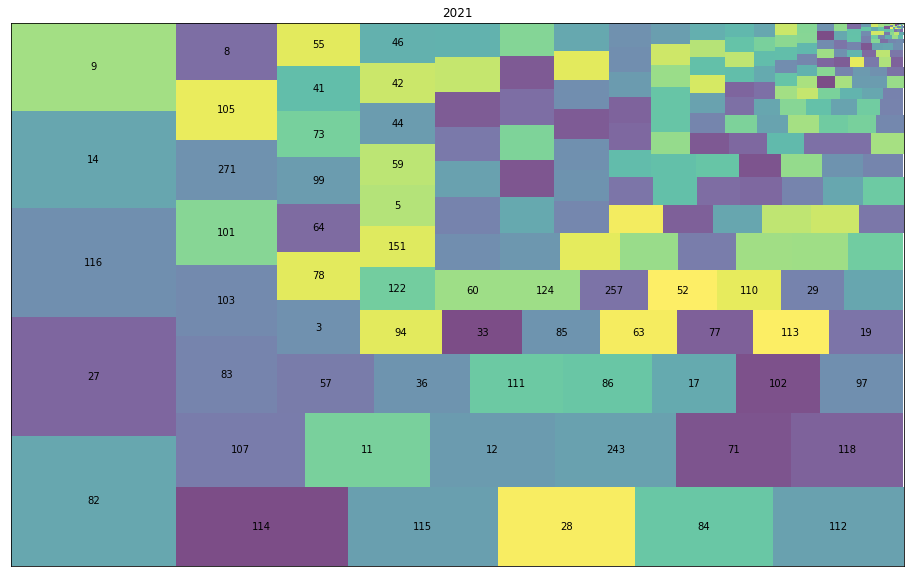

In [16]:
fig, (ax1) = plt.subplots(1,1, figsize=(16,10))
ax1.set_title("2021")
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)
count_indices = list(relative_2021.index)
indices = ["" if i > 55 else count_indices[i] for i in range(len(count_indices))]
squarify.plot(sizes=relative_2021.values, label=indices, alpha=.7, ax=ax1)
plt.show()

In [17]:
# trip distance in meters
trip_distance_des_2021 = data_full_final.TripDistance.describe()


In [18]:
trip_distance_des_2021

count    8.124349e+06
mean     1.102001e+04
std      1.138722e+04
min      0.000000e+00
25%      3.857000e+03
50%      7.341000e+03
75%      1.435000e+04
max      6.666750e+05
Name: TripDistance, dtype: float64

In [19]:
mean_2021 = trip_distance_des_2021["mean"]
std_2021 = trip_distance_des_2021["std"]
# find zscores
zscores_2021 = stats.zscore(data_full_final.TripDistance, ddof=1)
# print minimum and maximum
np.min(zscores_2021),np.max(zscores_2021)

(-0.9677523733424902, 57.578165999726465)

In [20]:
ub_2021 = (3.0 * std_2021) + mean_2021
ub_2021

45181.65206055269

In [21]:
# how many trip distances are more than 3 STDS above the mean
len(data_full_final.query("TripDistance > 45200"))

86922

In [22]:
longest_trips_2021 = data_full_final.query("TripDistance > 45200")
longest_trips_2021.head()

,AutoID,DID,CTO,Fleet,MeterState,Latitude,Longitude,GPSSpeed,Heading,Odometer,MaximumSpeedMeterOff,FlagfallIncome,JobIncomeMeterOff,ExtrasIncome,DistanceIncome,WaitingIncome,MinutesSinceLastJob,MinutesStationarySinceLastJob,JobNumber,PaymentType,Area,VehiclePlate,ShiftSeqNumber,SeqNumber,OdometerTrip,JobWaitingTime,JobTollsExtras,JobPhoneUseTime,JobLeg,POSautoID,DiscountID,Charity,ADMAautoID,SharedRide,ForeignExID,AutoID (#1),CTO (#1),Fleet (#1),MeterState (#1),DropoffDatetime,DropoffLatitude,DropoffLongitude,GPSSpeed (#1),Heading (#1),Odometer (#1),MaximumSpeedMeterOff (#1),FlagfallIncome (#1),TotalFare,ExtrasIncome (#1),DistFare,WaitFare,MinutesSinceLastJob (#1),MinutesStationarySinceLastJob (#1),JobNumber (#1),PaymentType (#1),DropoffArea,VehiclePlate (#1),TripDistance,JobWaitingTime (#1),JobTollsExtras (#1),JobPhoneUseTime (#1),JobLeg (#1),POSautoID (#1),DiscountID (#1),Charity (#1),ADMAautoID (#1),SharedRide (#1),ForeignExID (#1)
DateTimeLogged,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:15,1644592583,0002180399,416,1,1,25.251950,55.291576,16,120,216754,87,5.5,0,0,0,0,0,0,0,$,57,XB616,2016,17,0,0,0,0,1,0,0,0,0,0,0,1644620319,416,1,0,2021-01-01 01:14:59,25.104578,55.148712,0,0,262458,87,0.0,104.5,0.0,84.0,15.0,0,0,0,$,107,XB616,45704,0,0,0,1,0,0,0,0,0,0
2021-01-01 07:01:38,1644739629,0002070837,1763,1,1,25.078894,55.370180,1,142,106754,118,8.0,0,0,0,0,0,0,75164550,$,131,DW184,2928,4,0,0,0,0,1,0,0,0,0,0,0,1644745413,1763,1,0,2021-01-01 07:36:26,25.102003,55.178110,0,0,156740,118,0.0,104.0,0.0,95.0,1.0,0,0,75164550,$,112,DW184,49986,0,4,0,1,0,0,0,0,0,0
2021-01-01 15:28:59,1644891490,0002191748,357,1,1,25.093699,55.154892,13,290,193680,74,5.0,0,0,0,0,0,0,0,$,105,XA657,594,10,0,0,0,0,1,0,0,0,0,0,0,1644924154,357,1,0,2021-01-01 16:42:51,24.408535,54.475887,0,0,304908,74,0.0,220.0,0.0,212.0,3.0,0,0,0,$,134,XA657,111228,0,4,0,1,0,0,0,0,0,0
2021-01-01 15:29:00,1644891491,0002181417,2664,1,1,25.173458,55.412148,40,284,59416,105,5.0,0,0,0,0,0,0,0,$,77,XA433,2101,3,0,0,0,0,1,0,0,0,0,0,0,1644905571,2664,1,0,2021-01-01 16:02:06,25.000938,55.105347,0,0,105026,105,0.0,92.5,0.0,86.5,1.0,0,0,0,$,122,XA433,45610,0,0,0,1,0,0,0,0,0,0
2021-01-01 03:23:39,1644683894,0002191320,10534,1,1,25.245447,55.359276,43,272,17210,118,25.0,0,0,0,0,0,0,75155036,$,14,XA484,1259,1,0,0,0,0,1,0,0,0,0,0,0,1651323462,945,1,0,2021-01-15 17:37:01,25.540470,55.715237,3,86,82403,116,0.0,138.5,20.0,116.5,17.0,0,0,0,$,140,XB007,61849,0,0,0,1,0,0,0,0,0,0


In [23]:
# remove trips that are greater than 48km
data_full_final = data_full_final.query("TripDistance < 48000")

In [24]:
len(data_full_final.query("TotalFare < 4"))

7

In [25]:
# fare amount
# remove fares smaller than 4 AED which is minimum price
data_full_final = data_full_final.query("TotalFare >=4")

In [26]:
fare_amount_des_2021 = data_full_final.TotalFare.describe()

In [27]:
fare_amount_des_2021

count    8.055055e+06
mean     2.827152e+01
std      1.945784e+01
min      4.000000e+00
25%      1.400000e+01
50%      2.150000e+01
75%      3.651000e+01
max      5.415000e+02
Name: TotalFare, dtype: float64

In [28]:
mean_2021 = fare_amount_des_2021["mean"]
std_2021 = fare_amount_des_2021["std"]
# find zscores
zscores_2021 = stats.zscore(data_full_final.TotalFare, ddof=1)
# print minimum and maximum
np.min(zscores_2021), np.max(zscores_2021)

(-1.2473901265833607, 26.37642962873313)

In [29]:
# no lower bound because minimum zscore is greater than -3
ub_2021 = (3.0 * std_2021) + mean_2021
print("upper-bounds", ub_2021)

upper-bounds 86.64505826003837


In [30]:
data_full_final.tail()

,AutoID,DID,CTO,Fleet,MeterState,Latitude,Longitude,GPSSpeed,Heading,Odometer,MaximumSpeedMeterOff,FlagfallIncome,JobIncomeMeterOff,ExtrasIncome,DistanceIncome,WaitingIncome,MinutesSinceLastJob,MinutesStationarySinceLastJob,JobNumber,PaymentType,Area,VehiclePlate,ShiftSeqNumber,SeqNumber,OdometerTrip,JobWaitingTime,JobTollsExtras,JobPhoneUseTime,JobLeg,POSautoID,DiscountID,Charity,ADMAautoID,SharedRide,ForeignExID,AutoID (#1),CTO (#1),Fleet (#1),MeterState (#1),DropoffDatetime,DropoffLatitude,DropoffLongitude,GPSSpeed (#1),Heading (#1),Odometer (#1),MaximumSpeedMeterOff (#1),FlagfallIncome (#1),TotalFare,ExtrasIncome (#1),DistFare,WaitFare,MinutesSinceLastJob (#1),MinutesStationarySinceLastJob (#1),JobNumber (#1),PaymentType (#1),DropoffArea,VehiclePlate (#1),TripDistance,JobWaitingTime (#1),JobTollsExtras (#1),JobPhoneUseTime (#1),JobLeg (#1),POSautoID (#1),DiscountID (#1),Charity (#1),ADMAautoID (#1),SharedRide (#1),ForeignExID (#1)
DateTimeLogged,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-31 08:45:18,1657798923,0002200476,9846,1,1,25.277290,55.353012,4,0,14567,82,5.0,0,0,0,0,0,0,0,$,36,XA193,2464,1,0,0,0,0,1,0,0,0,0,0,0,1657819779,9846,1,0,2021-01-31 09:34:44,25.187683,55.377945,0,0,44630,82,0.0,73.0,0.0,56.5,11.5,0,0,0,$,18,XA193,30063,0,0,0,1,0,0,0,0,0,0
2021-01-31 08:45:18,1657798925,0002162186,1554,1,1,25.202984,55.279110,3,8,129530,118,5.0,0,0,0,0,0,0,0,$,69,DW107,171,2,0,0,0,0,1,0,0,0,0,0,0,1657805835,1554,1,0,2021-01-31 09:00:56,25.097948,55.163390,0,0,149766,118,0.0,43.5,0.0,38.0,0.5,0,0,0,C,105,DW107,20236,0,8,0,1,49893054,0,0,0,0,0
2021-01-31 08:45:17,1657798929,0002200339,4897,1,1,25.095737,55.153410,0,0,90382,83,12.0,0,0,0,0,0,0,76029070,$,105,HTD659,2633,5,0,0,0,0,1,0,0,0,0,0,0,1657805936,4897,1,0,2021-01-31 09:01:07,25.213690,55.279860,0,0,110161,83,0.0,50.0,0.0,37.0,1.0,0,0,76029070,$,71,HTD659,19779,0,8,0,1,0,0,0,10077045,0,0
2021-01-31 08:45:18,1657798932,0002200515,2512,1,1,25.031557,55.150173,0,0,34604,118,12.0,0,0,0,0,0,0,76028947,$,118,HTD893,1250,2,0,0,0,0,1,0,0,0,0,0,0,1657806453,2512,1,0,2021-01-31 09:02:19,25.126787,55.208473,0,0,53136,118,0.0,49.0,0.0,35.0,2.0,0,0,76028947,$,99,HTD893,18532,0,4,0,1,0,0,0,10077082,0,0
2021-01-31 08:45:19,1657798933,0002201321,891,1,1,25.300745,55.383160,6,250,55197,95,5.0,0,0,0,0,0,0,0,$,27,DS221,276,2,0,0,0,0,1,0,0,0,0,0,0,1657805242,891,1,0,2021-01-31 08:59:42,25.267141,55.394917,0,0,62647,95,0.0,21.5,0.0,14.0,2.5,0,0,0,$,30,DS221,7450,0,0,0,1,0,0,0,0,0,0


In [31]:
data_full_final["duration"] = (data_full_final.DropoffDatetime - data_full_final.index).astype('timedelta64[s]')
# convert seconds to hours
data_full_final["duration"] = data_full_final["duration"]/3600.
# km per hour
data_full_final["speed"] = data_full_final.TripDistance /(1000*data_full_final.duration)

In [32]:
len(data_full_final.query("duration < 0"))


20702

In [33]:
# remove negative and zero durations
data_full_final = data_full_final.query("duration > 0")

In [34]:
duration_desc_2021 = data_full_final.duration.describe()


In [35]:
mean_2021 = duration_desc_2021["mean"]
std_2021 = duration_desc_2021["std"]
# find zscores
zscores_2021 = stats.zscore(data_full_final.duration, ddof=1)
# print minimum and maximum
np.min(zscores_2021), np.max(zscores_2021)


(-0.04851646929107088, 41.684731109447455)

In [36]:
len(data_full_final.query("duration > 1.5"))

25614

In [37]:
# most trips are below 1.5 hours. 
data_full_final = data_full_final.query("duration < 1.5 ")

In [38]:

scolumns = ['Area',
            'TripDistance',
            'duration',
           'TotalFare'
          ]

data_full_final_upd=data_full_final[scolumns]

In [39]:
data_full_final_upd.isnull().sum()

Area            0
TripDistance    0
duration        0
TotalFare       0
dtype: int64

In [40]:
data_full_final_upd.describe()
# The average trip duration in Dubai is around 15 minutes.
# 75% of trips in Dubai are less than 16km

,Area,TripDistance,duration,TotalFare
count,8.008712e+06,8.008712e+06,8.008712e+06,8.008712e+06
mean,8.621313e+01,1.045041e+04,2.372687e-01,2.824120e+01
std,6.567136e+01,9.055450e+03,1.408686e-01,1.937296e+01
min,0.000000e+00,0.000000e+00,2.777778e-04,4.000000e+00
25%,3.000000e+01,3.835000e+03,1.369444e-01,1.400000e+01
50%,8.200000e+01,7.262000e+03,2.052778e-01,2.150000e+01
75%,1.140000e+02,1.405900e+04,3.061111e-01,3.650000e+01
max,3.110000e+02,4.799900e+04,1.499722e+00,2.890000e+02


In [41]:
from pathlib import Path

import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    resample_duration = ["15min", "30min", "1H"]
    #resample_duration = ["17min"]
    #resample_duration = ["30min", "1H"]
    
    for dur in resample_duration:
        print("resampling by ", dur)
        data_full_final_resampled = data_full_final_upd.groupby("Area").apply(lambda x: x.resample(dur).sum())
        data_full_final_resampled = data_full_final_resampled.drop("Area", axis=1)
        # get average speed(in kmph) from aggregated data
        data_full_final_resampled["speed"] = data_full_final_resampled.TripDistance / data_full_final_resampled.duration    
        directory_in_str = Path(f"taxi_data/data_2021_samples/y2021_{dur}.csv")
        directory_in_str.parent.mkdir(parents=True, exist_ok=True)
        data_full_final_resampled.to_csv(directory_in_str)                 


resampling by  15min
resampling by  30min
resampling by  1H


In [42]:
data_full_final_resampled.head()

TripDistance  duration  TotalFare         speed
Area DateTimeLogged                                                      
0    2021-01-19 23:00:00         25161  0.471389      56.00  53376.311137
1    2021-01-01 00:00:00        151213  5.098889     452.75  29656.068860
     2021-01-01 01:00:00        199802  5.643056     578.50  35406.704406
     2021-01-01 02:00:00        169654  4.203333     458.50  40361.776368
     2021-01-01 03:00:00         35406  1.057778     111.50  33472.058824

In [43]:
areas=data_full_final_upd.Area.unique()
# len(areas)
areas

array([114,  82, 262,  41,  14,  85, 271, 115, 116,  78, 160,   4,  16,
        92, 108,  10,   9, 261, 103, 105,  12,  71, 257,  35,  27, 272,
       238,  94,  13,  59,  53,   3, 144, 233,  69, 112,  57, 101, 269,
       157,  84,  17, 185,  93,  95,  67, 151,   7, 111, 274,  11,  61,
        60, 107,  98,  63,  83,  86, 118, 131,  51, 102,  23, 189,  76,
         6, 122, 110,  55,  97,   8,  28,  22,  29,  66, 124,  52, 119,
        73,  46,  56, 109, 243,  77,  64,  88,  26, 146,   5, 121, 260,
       223,  58,  90,  44,  33,  65, 113, 104,  89, 100,  45, 258, 226,
       149, 266,  50,  42,  48,  81,  34,  19, 106,  36, 148,  32,  18,
       161,  24,  75,  96,  15, 145, 222, 211,  38,   1,  47, 263, 216,
       268,  21,  30, 197,  43,  70, 241, 155, 259, 240, 125,  54, 143,
        37,   2,  79, 184, 138, 265, 152,  49, 224, 267, 215,  91, 153,
       231, 201,  99,  20,  74, 225, 207,  40, 264, 270, 129, 195,  80,
       220, 154, 235,  87,  62, 182, 247, 219,  31, 150, 180, 12

In [44]:
year = 2021
directory_in_str="taxi_data"
for dur in ["15min", "30min", "1H"]:
  print()
  print(dur)
  df = pd.read_csv(directory_in_str + f"/data_{year}_samples/y{year}_{dur}.csv", 
                   index_col=1)
  # how many percent of it is 0
  number_of_trips = df.groupby("Area").size()
  zeros_percent = df.groupby("Area").\
  apply(lambda g: np.sum((g.TotalFare == 0))*100/len(g))
  
  combined = pd.concat([number_of_trips, zeros_percent], axis=1)
  combined.columns = ["num_trips", "zeros_percent"]
  # sort by number of trips followed by amount of nulls
  combined.sort_values(by=["num_trips", "zeros_percent"], ascending=False, inplace=True)
  #print(combined)
  mean = np.mean(combined.num_trips)
  std = np.std(combined.num_trips, ddof=1)
  # lower bound
  lb = -3 * std + mean
  #print(lb)
  #print(combined)
  # number of trips in a location shall not be very small(non-outlier)
  selected_locations2 = combined.query("num_trips > @lb & zeros_percent < 5").index
  print(len(selected_locations2))
  print(selected_locations2)


15min
30
Int64Index([ 55,  86, 103,  46, 102,  57,  83,  28,   5,   3, 118,  77,  41,
            112,  11,   8, 114, 111, 115,  84, 116,  82,  14,  36,   9,  27,
             12,  73, 107,  71],
           dtype='int64', name='Area')

30min
55
Int64Index([131, 113,  29,  26,  53,  52,  19, 124, 105,  66, 145,  59,  44,
             60,  63,  45,  64,  17,  78,  85,  76,  42,   4,  33,  55,  86,
              7, 103,  73, 102,  46,  83,  57,   3,   5, 118,  28,  77,   8,
             11,  41, 107, 112, 114, 111,  84,   9,  12,  14,  27,  36,  82,
            115, 116,  71],
           dtype='int64', name='Area')

1H
81
Int64Index([257, 109,   2,  43, 122,  94,  69,  47,  89,  98,  35,  67,  51,
            144, 271, 151,  88,  31,  15, 110,  34,   6,  10, 131, 146, 106,
             37, 113,  53,  29,  52,  60,  66, 124,  59, 105,  19,  26,  44,
             45, 145,  78,  64,  63,  85,   4,  55,  83,   7,  17,  33,  71,
             42,  73,  76,  86, 112,   3,   5,   8,   9,  11,  1

# Univariate Forecasting: ARIMA

In [45]:
from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.stattools import adfuller

from math import sqrt
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima_model import ARIMA
#from pyramid.arima import auto_arima

In [46]:
# the following areas are the busiest places sorted by availability of trips every 15 minutes
selected_locations=[ 78,  55,  57,  28,  83,   5, 118,  77,  41,  11, 114,   8, 115,
             84,  82, 116,   9,  27,   4,  17,  42,  85,  33,   7,  86,  73,
            103,  46, 102,   3, 112, 107, 111,  14,  36,  12,  71]

In [47]:
year = 2021
dur = "15min"
# for google cloud platform vm and local machine
directory_in_str = "taxi_data"


y2021_15min_df = pd.read_csv(directory_in_str + f"/data_{year}_samples/y{year}_{dur}.csv", 
                   index_col=1)
y2021_15min_df.index = pd.to_datetime(y2021_15min_df.index)
y2021_15min_df.head()


,Area,TripDistance,duration,TotalFare,speed
DateTimeLogged,,,,,
2021-01-19 23:45:00,0,25161,0.471389,56.00,53376.311137
2021-01-01 00:00:00,1,50671,2.023056,157.00,25046.766442
2021-01-01 00:15:00,1,21443,0.671667,60.75,31925.062035
2021-01-01 00:30:00,1,59723,1.835833,165.00,32531.820245
2021-01-01 00:45:00,1,19376,0.568333,70.00,34092.668622


In [48]:
print(y2021_15min_df.index)
print(y2021_15min_df.TotalFare.describe())

DatetimeIndex(['2021-01-19 23:45:00', '2021-01-01 00:00:00',
               '2021-01-01 00:15:00', '2021-01-01 00:30:00',
               '2021-01-01 00:45:00', '2021-01-01 01:00:00',
               '2021-01-01 01:15:00', '2021-01-01 01:30:00',
               '2021-01-01 01:45:00', '2021-01-01 02:00:00',
               ...
               '2021-03-31 21:30:00', '2021-03-31 21:45:00',
               '2021-03-31 22:00:00', '2021-03-31 22:15:00',
               '2021-03-31 22:30:00', '2021-03-31 22:45:00',
               '2021-03-31 23:00:00', '2021-03-31 23:15:00',
               '2021-03-31 23:30:00', '2021-03-31 23:45:00'],
              dtype='datetime64[ns]', name='DateTimeLogged', length=2257665, freq=None)
count    2.257665e+06
mean     1.001812e+02
std      2.584177e+02
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      9.600000e+01
max      1.511156e+04
Name: TotalFare, dtype: float64


In [49]:
# selected locations
y2021_15min_df = y2021_15min_df.query('Area in @selected_locations')

In [50]:
y2021_15min_df.query("Area == 82").iloc[0:20005]
y2021_15min_df.shape

(319672, 5)

In [51]:
print(len(y2021_15min_df[y2021_15min_df.speed.isnull()]))


7561


In [52]:
y2021_15min_df[y2021_15min_df.speed.isnull()].head()

,Area,TripDistance,duration,TotalFare,speed
DateTimeLogged,,,,,
2021-01-05 05:00:00,3,0,0.0,0.0,NaN
2021-01-06 05:00:00,3,0,0.0,0.0,NaN
2021-01-07 04:30:00,3,0,0.0,0.0,NaN
2021-01-08 05:30:00,3,0,0.0,0.0,NaN
2021-01-11 04:15:00,3,0,0.0,0.0,NaN


In [53]:
# ffill zeros 
y2021_15min_df_ff = y2021_15min_df.replace(to_replace=0, method="ffill")

In [54]:
# recompute speed for NaNs
y2021_15min_df_ff.speed.fillna(y2021_15min_df_ff.TripDistance/y2021_15min_df_ff.duration, inplace=True)

In [55]:
# y2021_15min_df.to_csv('15mindata.csv')

In [56]:
series_by_loc_dict = {loca:y2021_15min_df_ff.query(f"Area == {loca}") for loca in selected_locations}

In [57]:
series_by_loc_dict[82].head()

,Area,TripDistance,duration,TotalFare,speed
DateTimeLogged,,,,,
2021-01-01 00:00:00,82,630998,20.655833,1620.51,30548.174446
2021-01-01 00:15:00,82,1275255,40.930833,3263.54,31156.340982
2021-01-01 00:30:00,82,855844,22.181667,2093.50,38583.394695
2021-01-01 00:45:00,82,896610,25.056389,2290.03,35783.687904
2021-01-01 01:00:00,82,1050856,23.964167,2505.00,43851.138853


In [58]:
series_by_loc_dict[111].head()

,Area,TripDistance,duration,TotalFare,speed
DateTimeLogged,,,,,
2021-01-01 00:00:00,111,62352,1.291389,161.50,48282.899548
2021-01-01 00:15:00,111,85159,1.648056,234.01,51672.408562
2021-01-01 00:30:00,111,124714,2.240000,302.00,55675.892857
2021-01-01 00:45:00,111,148036,3.046667,354.50,48589.496718
2021-01-01 01:00:00,111,193380,3.524444,480.00,54868.221942


In [59]:
len(selected_locations)


37

In [60]:
import copy

df_by_loc={}

for loc in selected_locations:
    key_name='loc_df_'+str(loc)
    df_by_loc[key_name]=copy.deepcopy(series_by_loc_dict[loc])
    


In [61]:
df_by_loc['loc_df_82']

,Area,TripDistance,duration,TotalFare,speed
DateTimeLogged,,,,,
2021-01-01 00:00:00,82,630998,20.655833,1620.51,30548.174446
2021-01-01 00:15:00,82,1275255,40.930833,3263.54,31156.340982
2021-01-01 00:30:00,82,855844,22.181667,2093.50,38583.394695
2021-01-01 00:45:00,82,896610,25.056389,2290.03,35783.687904
2021-01-01 01:00:00,82,1050856,23.964167,2505.00,43851.138853
...,...,...,...,...,...
2021-03-31 22:45:00,82,407819,10.069167,1093.01,40501.762807
2021-03-31 23:00:00,82,728264,14.700833,1829.04,49538.960376
2021-03-31 23:15:00,82,845551,18.412778,2173.52,45921.968440


In [62]:
# overall plot



trace82 = go.Scatter(x=df_by_loc['loc_df_82'].index, y=df_by_loc['loc_df_82'].TotalFare, mode="lines", name="loc-82") 
trace111 = go.Scatter(x=df_by_loc['loc_df_111'].index, y=df_by_loc['loc_df_111'].TotalFare, mode="lines", name="loc-111") 
trace116 = go.Scatter(x=df_by_loc['loc_df_116'].index, y=df_by_loc['loc_df_116'].TotalFare, mode="lines", name="loc-116") 
trace11 = go.Scatter(x=df_by_loc['loc_df_11'].index, y=df_by_loc['loc_df_11'].TotalFare, mode="lines", name="loc-11") 


fig = tools.make_subplots(rows=2, cols=2, shared_yaxes=True, subplot_titles=('Loc82', 'Loc111', 'Loc116', 'Loc11'))
                                                         
fig.append_trace(trace82, 1, 1)
fig.append_trace(trace111, 1, 2)
fig.append_trace(trace116, 2, 1)
fig.append_trace(trace11, 2, 2)


fig['layout'].update(height=600, width=1024, title='')
config={'scrollZoom':False,'displayModeBar':False, "showLink":False, 'showTips':False}

pyo.iplot(fig, filename='make-subplots-multiple-with-titles', config=config)

C:\Users\Zhaks\anaconda3\lib\site-packages\plotly\tools.py:461: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [63]:
# monthly plot
def plot_monthly(the_data):
    mtitles = pd.Series(np.arange(1, 4)).apply(lambda x: calendar.month_abbr[x])
    #print(mtitles)
    fig = tools.make_subplots(rows=1, cols=3, subplot_titles=mtitles.values)

    row = 1
    col = 1
    for i in range(1, 4):
      monthly_data = the_data.loc[f"2021-{i}"]
      trace = go.Scatter(x=monthly_data.index, y=monthly_data.TotalFare, mode="lines", name=f"{mtitles[i-1]}") 
      fig.append_trace(trace, row, col)
      if(col == 4):
        row += 1
        col = 1
      else:
        col +=1


    fig['layout'].update(height=600, width=1024, title='')
    config={'scrollZoom':False,'displayModeBar':False, "showLink":False, 'showTips':False, "staticPlot":True}

    pyo.iplot(fig, filename='make-subplots-multiple-with-titles', config=config)


In [64]:
plot_monthly(df_by_loc['loc_df_82'])

In [65]:
plot_monthly(df_by_loc['loc_df_111'])

In [66]:
plot_monthly(df_by_loc['loc_df_11'])

In [67]:
plot_monthly(df_by_loc['loc_df_116'])

In [68]:
# daily plot 2021
def plot_daily(the_series, month):
    if(month == 2):
      num_of_days = 28
    else:
      num_of_days = 30
    s  = pd.date_range(f'2021-{month}-01', f'2021-{month}-{num_of_days}', freq='D').to_series()
    fig = tools.make_subplots(rows=6, cols=5, subplot_titles=s.dt.day_name().values)

    row = 1
    col = 1
    for i in range(1, num_of_days + 1):
      daily_data = the_series.loc[f"2021-{month}-{i}"]
      trace = go.Scatter(x=daily_data.index, y=daily_data.values, mode="lines")
      fig.append_trace(trace, row, col)
      if(col == 5):
        row += 1
        col = 1
      else:
        col +=1
    
    

    fig['layout'].update(xaxis=dict(
        titlefont=dict(
            family='Arial, sans-serif',
            size=3),
        showticklabels=False))
    fig['layout'].update(height=1000, width=1024, title='', showlegend=False)
    config={'scrollZoom':False,'displayModeBar':False, "showLink":False, 'showTips':False, "staticPlot":True}

    pyo.iplot(fig, filename='make-subplots-multiple-with-titles', config=config)

In [69]:
plot_daily(df_by_loc['loc_df_82'].TotalFare, 1)

In [70]:
plot_daily(df_by_loc['loc_df_111'].TotalFare, 1)

In [71]:
plot_daily(df_by_loc['loc_df_116'].TotalFare, 1)

In [72]:
plot_daily(df_by_loc['loc_df_11'].TotalFare, 1)

In [73]:
#Test of stationarity

# Rolling Statistics

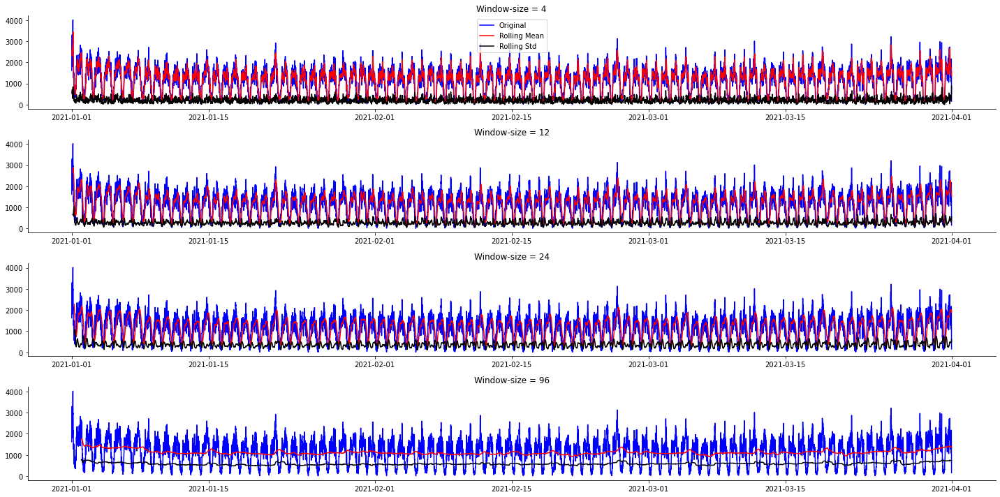

In [74]:
fig, ax = plt.subplots(4, 1, figsize=(20,10))

# 1 hour, 3 hours, 6 hours, 24 hours
for i, wsize in enumerate([4, 12, 24, 96]):
  roll_mean = df_by_loc['loc_df_82'].TotalFare.rolling(window=wsize).mean()
  roll_std = df_by_loc['loc_df_82'].TotalFare.rolling(window=wsize).std()
  ax[i].plot(df_by_loc['loc_df_82'].TotalFare, color='blue', label="Original")
  ax[i].plot(roll_mean, color='red', label="Rolling Mean")
  ax[i].plot(roll_std, color='black', label="Rolling Std")
  ax[i].set_title(f"Window-size = {wsize}")
ax[0].legend(loc="best")
sns.despine()
# it adjusts the spacing
fig.tight_layout()
plt.show(block=False)

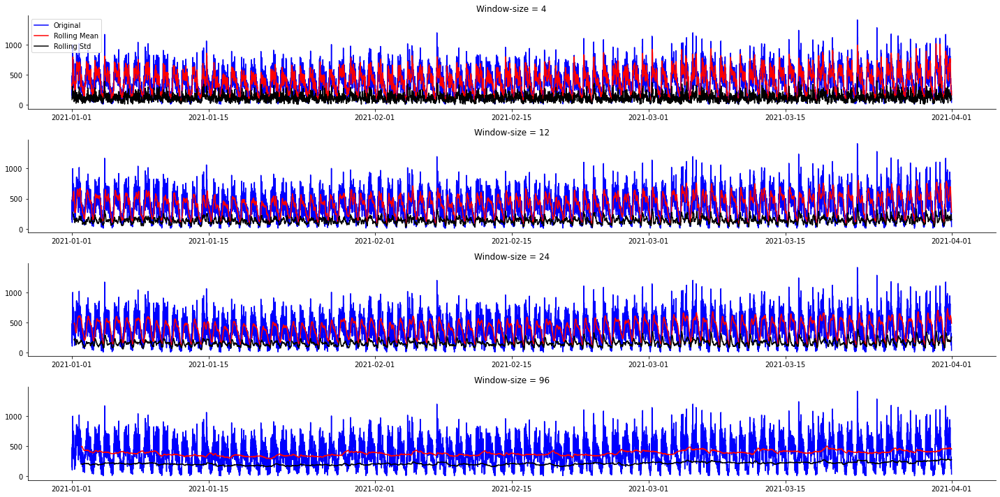

In [75]:
fig, ax = plt.subplots(4, 1, figsize=(20,10))

# 1 hour, 3 hours, 6 hours, 24 hours
for i, wsize in enumerate([4, 12, 24, 96]):
  roll_mean = df_by_loc['loc_df_111'].TotalFare.rolling(window=wsize).mean()
  roll_std = df_by_loc['loc_df_111'].TotalFare.rolling(window=wsize).std()
  ax[i].plot(df_by_loc['loc_df_111'].TotalFare, color='blue', label="Original")
  ax[i].plot(roll_mean, color='red', label="Rolling Mean")
  ax[i].plot(roll_std, color='black', label="Rolling Std")
  ax[i].set_title(f"Window-size = {wsize}")
ax[0].legend(loc="best")
sns.despine()
# it adjusts the spacing
fig.tight_layout()
plt.show(block=False)

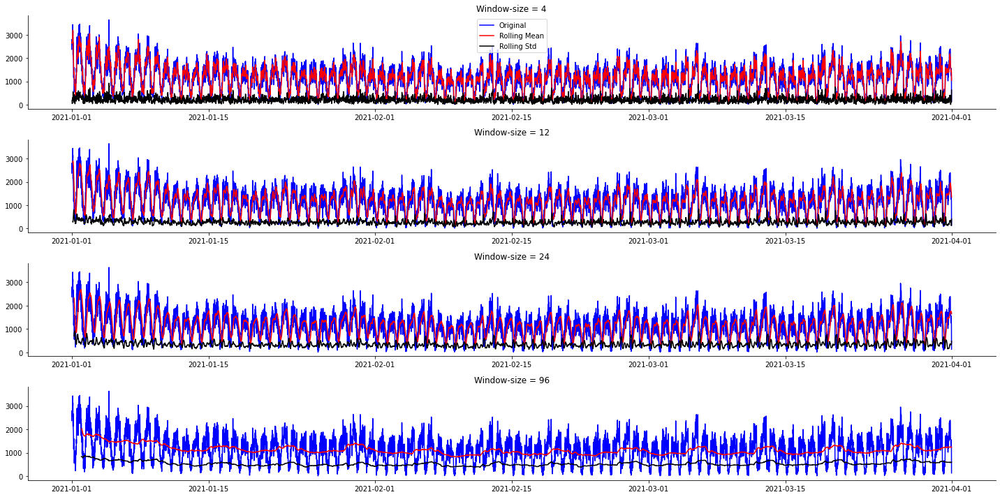

In [76]:
fig, ax = plt.subplots(4, 1, figsize=(20,10))

# 1 hour, 3 hours, 6 hours, 24 hours
for i, wsize in enumerate([4, 12, 24, 96]):
  roll_mean = df_by_loc['loc_df_116'].TotalFare.rolling(window=wsize).mean()
  roll_std = df_by_loc['loc_df_116'].TotalFare.rolling(window=wsize).std()
  ax[i].plot(df_by_loc['loc_df_116'].TotalFare, color='blue', label="Original")
  ax[i].plot(roll_mean, color='red', label="Rolling Mean")
  ax[i].plot(roll_std, color='black', label="Rolling Std")
  ax[i].set_title(f"Window-size = {wsize}")
ax[0].legend(loc="best")
sns.despine()
# it adjusts the spacing
fig.tight_layout()
plt.show(block=False)

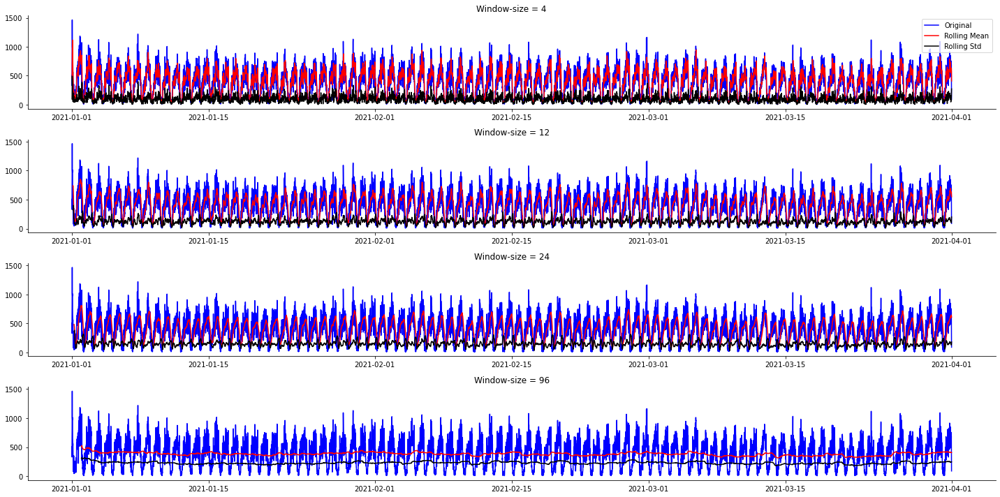

In [77]:
fig, ax = plt.subplots(4, 1, figsize=(20,10))

# 1 hour, 3 hours, 6 hours, 24 hours
for i, wsize in enumerate([4, 12, 24, 96]):
  roll_mean = df_by_loc['loc_df_11'].TotalFare.rolling(window=wsize).mean()
  roll_std = df_by_loc['loc_df_11'].TotalFare.rolling(window=wsize).std()
  ax[i].plot(df_by_loc['loc_df_11'].TotalFare, color='blue', label="Original")
  ax[i].plot(roll_mean, color='red', label="Rolling Mean")
  ax[i].plot(roll_std, color='black', label="Rolling Std")
  ax[i].set_title(f"Window-size = {wsize}")
ax[0].legend(loc="best")
sns.despine()
# it adjusts the spacing
fig.tight_layout()
plt.show(block=False)

In [78]:
# daily plot with rolling statitics # 2021
def plot_daily_rolling_statistics(the_series, month, plot_mean=True, window_size=4):
    if(month == 2):
      num_of_days = 28
    else:
      num_of_days = 30
      
    s  = pd.date_range(f'2021-{month}-01', f'2021-{month}-{num_of_days}', freq='D').to_series()
    fig = tools.make_subplots(rows=6, cols=5, subplot_titles=s.dt.day_name().values)
    roll_mean = the_series.rolling(window=window_size).mean()
    roll_std = the_series.rolling(window=window_size).std()
    row = 1
    col = 1
    for i in range(1, num_of_days + 1):
      daily_data = the_series.loc[f"2021-{month}-{i}"]
      daily_r_mean = roll_mean.loc[f"2021-{month}-{i}"]
      daily_r_std = roll_std.loc[f"2021-{month}-{i}"]
      #o_trace = go.Scatter(x=daily_data.index, y=daily_data.fare_amount, mode="lines")
      r_mean_trace = go.Scatter(x=daily_r_mean.index, y=daily_r_mean.values, mode="lines")
      r_std_trace = go.Scatter(x=daily_r_std.index, y=daily_r_std.values, mode="lines")
      # plot either the mean or std on every grid of the subplot
      if(plot_mean == True):
        fig.append_trace(r_mean_trace, row, col)
      else:
        fig.append_trace(r_std_trace, row, col)
        
      if(col == 5):
        row += 1
        col = 1
      else:
        col +=1
    

    fig['layout'].update(xaxis=dict(
        titlefont=dict(
            family='Arial, sans-serif',
            size=3),
        showticklabels=False))
    fig['layout'].update(height=1024, width=1024, title='', showlegend=False)
    config={'scrollZoom':False,'displayModeBar':False, "showLink":False, 'showTips':False, "staticPlot":True}

    pyo.iplot(fig, filename='make-subplots-multiple-with-titles', config=config)

In [79]:
# loc82
# daily rolling mean
plot_daily_rolling_statistics(df_by_loc['loc_df_82'].TotalFare, 2, plot_mean=True, window_size=4)
# daily rolling std
plot_daily_rolling_statistics(df_by_loc['loc_df_82'].TotalFare, 2, plot_mean=False, window_size=4)

In [80]:
plot_daily_rolling_statistics(df_by_loc['loc_df_111'].TotalFare, 2, plot_mean=True, window_size=4)
# daily rolling std
plot_daily_rolling_statistics(df_by_loc['loc_df_111'].TotalFare, 2, plot_mean=False, window_size=4)

In [81]:
plot_daily_rolling_statistics(df_by_loc['loc_df_116'].TotalFare, 2, plot_mean=True, window_size=4)
# daily rolling std
plot_daily_rolling_statistics(df_by_loc['loc_df_116'].TotalFare, 2, plot_mean=False, window_size=4)

In [82]:
plot_daily_rolling_statistics(df_by_loc['loc_df_11'].TotalFare, 2, plot_mean=True, window_size=4)
# daily rolling std
plot_daily_rolling_statistics(df_by_loc['loc_df_111'].TotalFare, 2, plot_mean=False, window_size=4)

In [83]:
plot_daily_rolling_statistics(df_by_loc['loc_df_11'].TotalFare, 2, plot_mean=True, window_size=4)
# daily rolling std
plot_daily_rolling_statistics(df_by_loc['loc_df_11'].TotalFare, 2, plot_mean=False, window_size=4)

In [84]:
# Tests of Stationarity: Augmented Dickey–Fuller test

In [85]:
# the whole 82
dftest = adfuller(df_by_loc['loc_df_82'].TotalFare, autolag="AIC")
dfoutput = pd.Series(dftest[0:4], index=["Test Statistic", 'p value', 'Flags used', "Number of Observations Used"])
for key, value in dftest[4].items():
  dfoutput[f"Critical value {key}"] = value
print(dfoutput)

Test Statistic                  -20.672946
p value                           0.000000
Flags used                       27.000000
Number of Observations Used    8612.000000
Critical value 1%                -3.431110
Critical value 5%                -2.861876
Critical value 10%               -2.566949
dtype: float64


In [86]:
# the whole 111
dftest = adfuller(df_by_loc['loc_df_111'].TotalFare, autolag="AIC")
dfoutput = pd.Series(dftest[0:4], index=["Test Statistic", 'p value', 'Flags used', "Number of Observations Used"])
for key, value in dftest[4].items():
  dfoutput[f"Critical value {key}"] = value
print(dfoutput)

Test Statistic                  -19.738336
p value                           0.000000
Flags used                       31.000000
Number of Observations Used    8608.000000
Critical value 1%                -3.431110
Critical value 5%                -2.861876
Critical value 10%               -2.566949
dtype: float64


In [87]:
# the whole 116
dftest = adfuller(df_by_loc['loc_df_116'].TotalFare, autolag="AIC")
dfoutput = pd.Series(dftest[0:4], index=["Test Statistic", 'p value', 'Flags used', "Number of Observations Used"])
for key, value in dftest[4].items():
  dfoutput[f"Critical value {key}"] = value
print(dfoutput)

Test Statistic                  -19.846035
p value                           0.000000
Flags used                       26.000000
Number of Observations Used    8613.000000
Critical value 1%                -3.431109
Critical value 5%                -2.861876
Critical value 10%               -2.566949
dtype: float64


In [88]:
# the whole 7
dftest = adfuller(df_by_loc['loc_df_11'].TotalFare, autolag="AIC")
dfoutput = pd.Series(dftest[0:4], index=["Test Statistic", 'p value', 'Flags used', "Number of Observations Used"])
for key, value in dftest[4].items():
  dfoutput[f"Critical value {key}"] = value
print(dfoutput)

Test Statistic                  -22.476216
p value                           0.000000
Flags used                       29.000000
Number of Observations Used    8610.000000
Critical value 1%                -3.431110
Critical value 5%                -2.861876
Critical value 10%               -2.566949
dtype: float64


In [89]:
# daily adcf
def perform_dicky_fuller_test(the_series):
  # Test every day
  from statsmodels.tsa.stattools import adfuller
  num_of_days = [31, 28, 31]
  # count how many times null hypothesis is rejected
  count_of_reject = 0
  total_count = 0
  which_months = {i:0 for i in range(1,4)}
  for month in range(1, 4):
    for day in range(1, num_of_days[month - 1] + 1):
      the_day = the_series.loc[f"2021-{month}-{day}"]
      dftest = adfuller(the_day, autolag="AIC")
      dfoutput = pd.Series(dftest[0:4], index=["Test Statistic", 'p value', 'Flags used', "Number of Observations Used"])
      total_count += 1
      if(dfoutput["p value"] < 0.05):
        which_months[month] += 1
        count_of_reject += 1
  print(count_of_reject)
  print(total_count)
  print(which_months)

In [90]:
perform_dicky_fuller_test(df_by_loc['loc_df_116'].TotalFare)

0
90
{1: 0, 2: 0, 3: 0}


In [91]:
perform_dicky_fuller_test(df_by_loc['loc_df_111'].TotalFare)

3
90
{1: 2, 2: 1, 3: 0}


In [92]:
perform_dicky_fuller_test(df_by_loc['loc_df_82'].TotalFare)

0
90
{1: 0, 2: 0, 3: 0}


In [93]:
perform_dicky_fuller_test(df_by_loc['loc_df_11'].TotalFare)

0
90
{1: 0, 2: 0, 3: 0}


In [94]:
print ('Results of KPSS Test:')
kpsstest = kpss(df_by_loc['loc_df_82'].TotalFare, regression='c')
kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
for key,value in kpsstest[3].items():
    kpss_output['Critical Value (%s)'%key] = value
print (kpss_output)

Results of KPSS Test:
Test Statistic            0.213601
p-value                   0.100000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1843: FutureWarning:

The behavior of using nlags=None will change in release 0.13.Currently nlags=None is the same as nlags="legacy", and so a sample-size lag length is used. After the next release, the default will change to be the same as nlags="auto" which uses an automatic lag length selection method. To silence this warning, either use "auto" or "legacy"

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1876: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




In [95]:
print ('Results of KPSS Test:')
kpsstest = kpss(df_by_loc['loc_df_111'].TotalFare, regression='c')
kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
for key,value in kpsstest[3].items():
    kpss_output['Critical Value (%s)'%key] = value
print (kpss_output)

Results of KPSS Test:
Test Statistic            0.877968
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




In [96]:
print ('Results of KPSS Test:')
kpsstest = kpss(df_by_loc['loc_df_116'].TotalFare, regression='c')
kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
for key,value in kpsstest[3].items():
    kpss_output['Critical Value (%s)'%key] = value
print (kpss_output)

Results of KPSS Test:
Test Statistic            1.443083
p-value                   0.010000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




In [97]:
print ('Results of KPSS Test:')
kpsstest = kpss(df_by_loc['loc_df_11'].TotalFare, regression='c')
kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
for key,value in kpsstest[3].items():
    kpss_output['Critical Value (%s)'%key] = value
print (kpss_output)

Results of KPSS Test:
Test Statistic            0.148509
p-value                   0.100000
Lags Used                37.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1876: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




In [98]:
from statsmodels.tsa.stattools import acf, pacf
def plot_acf_pacf(the_series, lags=40):
  lag_acf = acf(the_series, nlags=lags)
  lag_pacf = pacf(the_series, nlags=lags, method='ols')
  plt.subplot(121)
  plt.plot(lag_acf)
  plt.axhline(y=0, linestyle='--', color='gray')
  plt.axhline(y=-1.96/np.sqrt(len(the_series)), linestyle='--', color='gray')
  plt.axhline(y=1.96/np.sqrt(len(the_series)), linestyle='--', color='gray')
  plt.title('Autocorrelation Function')

  plt.subplot(122)
  plt.plot(lag_pacf)
  plt.axhline(y=0, linestyle='--', color='gray')
  plt.axhline(y=-1.96/np.sqrt(len(the_series)), linestyle='--', color='gray')
  plt.axhline(y=1.96/np.sqrt(len(the_series)), linestyle='--', color='gray')
  plt.title('Partial Autocorrelation Function')
  plt.tight_layout()
  
def plot_acf_pacf_2(the_series, lags=40):
  pacf_df = pd.DataFrame(pacf(the_series, nlags=lags))
  acf_df = pd.DataFrame(acf(the_series), nlags=lags)

  fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,10))

  ax1.set_title("ACF")
  acf_df.plot(kind='bar', ax=ax1)

  ax2.set_title("PACF")
  pacf_df.plot(kind='bar', ax=ax2)

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:662: FutureWarning:

fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.



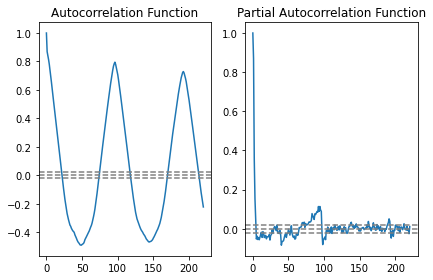

In [99]:
plot_acf_pacf(df_by_loc['loc_df_82'].TotalFare, lags=220)

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:662: FutureWarning:

fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.



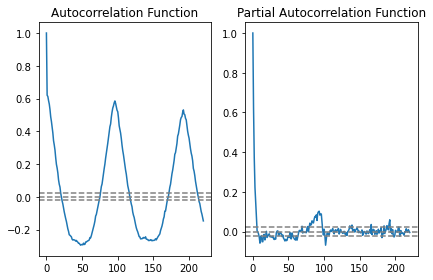

In [100]:
plot_acf_pacf(df_by_loc['loc_df_111'].TotalFare, lags=220)

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:662: FutureWarning:

fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.



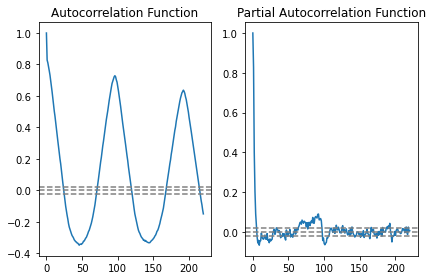

In [101]:
plot_acf_pacf(df_by_loc['loc_df_116'].TotalFare, lags=220)

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:662: FutureWarning:

fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.



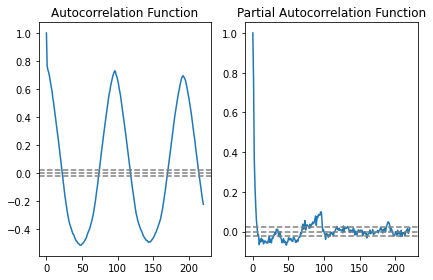

In [102]:
plot_acf_pacf(df_by_loc['loc_df_11'].TotalFare, lags=220)

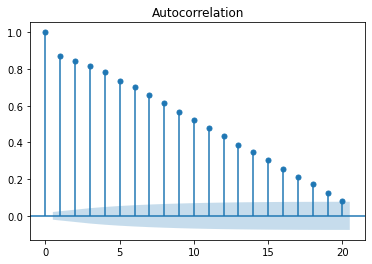

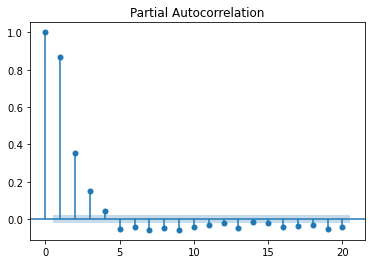

In [103]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(df_by_loc['loc_df_82'].TotalFare, lags=20)
plot_pacf(df_by_loc['loc_df_82'].TotalFare, lags=20)
plt.show()

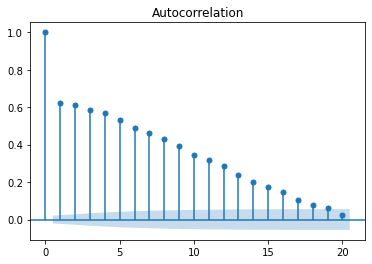

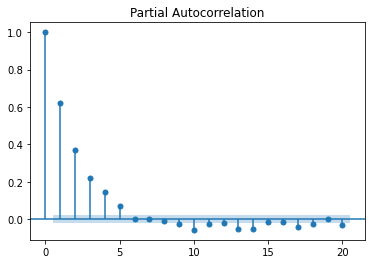

In [104]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(df_by_loc['loc_df_111'].TotalFare, lags=20)
plot_pacf(df_by_loc['loc_df_111'].TotalFare, lags=20)
plt.show()

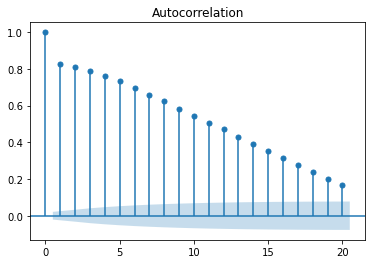

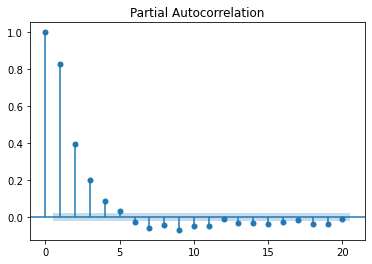

In [105]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(df_by_loc['loc_df_116'].TotalFare, lags=20)
plot_pacf(df_by_loc['loc_df_116'].TotalFare, lags=20)
plt.show()

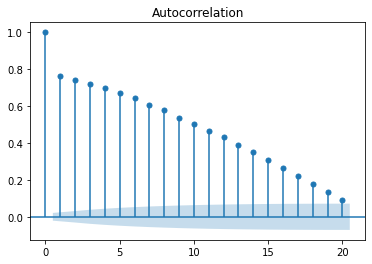

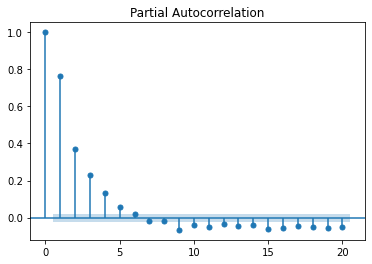

In [106]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_acf(df_by_loc['loc_df_11'].TotalFare, lags=20)
plot_pacf(df_by_loc['loc_df_11'].TotalFare, lags=20)
plt.show()

In [107]:
# loc78_df = series_by_loc_dict[78]
# loc55_df = series_by_loc_dict[55]
# loc57_df = series_by_loc_dict[57]
# loc28_df = series_by_loc_dict[28]
# loc83_df = series_by_loc_dict[83]
# loc5_df = series_by_loc_dict[5]
# loc118_df = series_by_loc_dict[118]
# loc77_df = series_by_loc_dict[77]
# loc41_df = series_by_loc_dict[41]
# loc11_df = series_by_loc_dict[11]
# loc114_df = series_by_loc_dict[114]
# loc8_df = series_by_loc_dict[8]
# loc115_df = series_by_loc_dict[115]
# loc84_df = series_by_loc_dict[84]
# loc82_df = series_by_loc_dict[82]
# loc111_df = series_by_loc_dict[111]
# loc116_df = series_by_loc_dict[116]
# loc7_df = series_by_loc_dict[7]
# loc9_df = series_by_loc_dict[9]
# loc27_df = series_by_loc_dict[27]
# loc4_df = series_by_loc_dict[4]
# loc17_df = series_by_loc_dict[17]
# loc42_df = series_by_loc_dict[42]
# loc85_df = series_by_loc_dict[85]
# loc33_df = series_by_loc_dict[33]
# loc86_df = series_by_loc_dict[86]
# loc73_df = series_by_loc_dict[73]
# loc103_df = series_by_loc_dict[103]
# loc46_df = series_by_loc_dict[46]
# loc102_df = series_by_loc_dict[102]
# loc3_df = series_by_loc_dict[3]
# loc112_df = series_by_loc_dict[112]
# loc107_df = series_by_loc_dict[107]
# loc14_df = series_by_loc_dict[14]
# loc36_df = series_by_loc_dict[36]
# loc12_df = series_by_loc_dict[12]
# loc71_df = series_by_loc_dict[71]

In [108]:
df_by_loc['loc_df_82']["2021-01":"2021-03-20"].TotalFare

DateTimeLogged
2021-01-01 00:00:00    1620.51
2021-01-01 00:15:00    3263.54
2021-01-01 00:30:00    2093.50
2021-01-01 00:45:00    2290.03
2021-01-01 01:00:00    2505.00
                        ...   
2021-03-20 22:45:00    1132.51
2021-03-20 23:00:00     801.51
2021-03-20 23:15:00    1043.00
2021-03-20 23:30:00     741.01
2021-03-20 23:45:00    1258.52
Name: TotalFare, Length: 7584, dtype: float64

In [109]:
import copy

train_by_loc={}
test_by_loc={}

for loc in selected_locations:
    key_name_train='train_'+str(loc)
    key_name_test='test'+str(loc)
    train_by_loc[key_name_train]=copy.deepcopy(df_by_loc[f'loc_df_{loc}']["2021-01":"2021-03-20"].TotalFare)
    test_by_loc[key_name_test]=copy.deepcopy(df_by_loc[f'loc_df_{loc}']["2021-03-21":"2021-03-31"].TotalFare)



In [110]:
# # train on 3 months
# train_82 = loc82_df["2021-01":"2021-03-20"].TotalFare
# # forecast the next week
# test_82 = loc82_df["2021-03-21":"2021-03-31"].TotalFare






In [111]:
# %%time


# aics = {}
# orders={}
# for loc in selected_locations:
#     aics['aics_%s' % loc] = []
    
# for loc in selected_locations:
#     orders['orders_%s' % loc] = []

# # aics82 = []
# # orders82 = []
# for loc in selected_locations:
#     for p in range(0, 5):
#         for d in range(2):
#             for q in range(5,10):
#                try:
#                   model = ARIMA(train_by_loc[f'train_{loc}'], order=(p, d, q), freq="15min")
#                   model_results = model.fit(disp=5)
#                   the_aic=model_results.aic
#                   params= p,d,q
#                   print (params, the_aic)
#                   aics[f'aics_{loc}'].append(the_aic)
#                   orders[f'orders_{loc}'].append(params)
#                except:
#                   pass

In [112]:
# # best order
# orders[np.argmin(aics)]

In [113]:
import warnings
# evaluate an ARIMA model for a given order (p,d,q)
def evaluate_arima_model(X, arima_order):
  # train on 2021 data 2.7 months
  train = X["2021-01":"2021-03-20"]
  # test on 2021 data one week
  test = X["2021-03-21":"2021-01-31"]
  history = [x for x in train]
  # make predictions
  predictions = list()
  for t in range(len(test)):
    print(t)
    with warnings.catch_warnings():
      warnings.simplefilter("ignore")
      model = ARIMA(history, order=arima_order, freq="15min")
      model_fit = model.fit(disp=1)
      yhat = model_fit.forecast()[0]
      predictions.append(yhat)
      history.append(test[t])
  # calculate out of sample error
  error = mean_squared_error(test, predictions)
  return error

# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(dataset, p_values, d_values, q_values):
    dataset = dataset.astype('float32')
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                print(order)
                #try:
                mse = evaluate_arima_model(dataset, order)
                if mse < best_score:
                    best_score, best_cfg = mse, order
                    print('ARIMA%s MSE=%.3f' % (order,mse))
                #except:
                 #   continue
    print('Best ARIMA%s MSE=%.3f' % (best_cfg, best_score))

In [114]:
df_by_loc['loc_df_11']["2021-03-21":"2021-03-31"].TotalFare

DateTimeLogged
2021-03-21 00:00:00    449.51
2021-03-21 00:15:00    439.51
2021-03-21 00:30:00    245.00
2021-03-21 00:45:00    178.00
2021-03-21 01:00:00    164.50
                        ...  
2021-03-31 22:45:00    754.57
2021-03-31 23:00:00    563.50
2021-03-31 23:15:00    693.11
2021-03-31 23:30:00    285.50
2021-03-31 23:45:00     89.50
Name: TotalFare, Length: 1056, dtype: float64

In [115]:
%%time


aics = []
orders = []
for p in range(0, 5):
    for d in range(2):
        for q in range(5,10):
           try:
              model = ARIMA(train_by_loc['train_82'], order=(p, d, q), freq="15min")
              model_results = model.fit(disp=5)
              the_aic=model_results.aic
              params= p,d,q
              print (params, the_aic)
              aics.append(the_aic)
              orders.append(params)
           except:
              pass

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning:


statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)




(0, 0, 5) 108324.85697123982
(0, 0, 6) 107882.61745922663
(0, 0, 7) 107592.38686179844
(0, 0, 8) 107296.95004738163
(0, 0, 9) 107088.40743753631
(0, 1, 5) 106459.82229771007
(0, 1, 6) 106448.88672185385
(0, 1, 7) 106448.34879064553
(0, 1, 8) 106448.68829206732
(0, 1, 9) 106448.71135310376
(1, 0, 5) 106299.9227156479
(1, 0, 6) 106274.69904052617
(1, 0, 7) 106264.30613180349
(1, 0, 8) 106254.9605159502
(1, 0, 9) 106256.54551264935
(2, 0, 5) 106300.5326439502
(2, 0, 6) 106038.80874121303
(2, 0, 7) 106040.35520372746
(2, 0, 8) 106040.97601595381
(2, 0, 9) 106258.09877252034
(3, 0, 5) 106041.06915895414
(3, 0, 6) 106039.79414197907
(3, 0, 7) 106039.61294746734
(3, 0, 8) 106041.51699866995
(3, 0, 9) 106043.35347050906
(4, 0, 5) 106041.78059051197


C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:701: RuntimeWarning:

overflow encountered in exp

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:701: RuntimeWarning:

invalid value encountered in true_divide

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:702: RuntimeWarning:

overflow encountered in exp

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:702: RuntimeWarning:

invalid value encountered in true_divide

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(4, 0, 6) 105970.47237548162


C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\base\model.py:547: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(4, 0, 7) 105894.18709259317


C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\base\model.py:547: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(4, 0, 8) 105984.55988113114


C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\base\model.py:547: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



(4, 0, 9) 105908.21283902985
Wall time: 7min 7s


In [116]:
# best order
orders[np.argmin(aics)]

(4, 0, 7)

In [117]:
%%time

import warnings
# forecast the next 900
# train on 3 months
train82 = df_by_loc['loc_df_82']["2021-01":"2021-03-20"].TotalFare
# forecast the next 1 week
test82 = df_by_loc['loc_df_82']["2021-03-21":"2021-03-31"].TotalFare
history82 = [x for x in train82]
# make predictions
predictions82 = list()
for t in range(200):
  # display status 
  if(t % 20 == 0):
    print("forecasting t+", t+1)
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    model = ARIMA(history82, order=(3,0,5))
    model_fit = model.fit(disp=1)
    yhat82 = model_fit.forecast()[0]
    predictions82.append(yhat82)
    history82.append(test82[t])

forecasting t+ 1
forecasting t+ 21
forecasting t+ 41
forecasting t+ 61
forecasting t+ 81
forecasting t+ 101
forecasting t+ 121
forecasting t+ 141
forecasting t+ 161
forecasting t+ 181
Wall time: 33min 50s


In [118]:
%%time


aics = []
orders = []
for p in range(0, 5):
    for d in range(2):
        for q in range(5,10):
           try:
              model = ARIMA(train_by_loc['train_111'], order=(p, d, q), freq="15min")
              model_results = model.fit(disp=5)
              the_aic=model_results.aic
              params= p,d,q
              print (params, the_aic)
              aics.append(the_aic)
              orders.append(params)
           except:
              pass

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning:


statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)




(0, 0, 5) 98380.2260877006
(0, 0, 6) 98199.72945577532
(0, 0, 7) 98050.55188435462
(0, 0, 8) 97904.17082574099
(0, 0, 9) 97766.04683327742
(0, 1, 5) 97576.56624971752
(0, 1, 6) 97578.51742195431
(0, 1, 7) 97576.84421962775
(0, 1, 8) 97578.55050860591
(0, 1, 9) 97579.65666758298
(1, 0, 5) 97369.01074144337
(1, 0, 6) 97367.85634742325
(1, 0, 7) 97352.52833991469
(1, 0, 8) 97344.57013534912
(1, 0, 9) 97342.83912365037
(2, 0, 5) 97207.32325108009
(2, 0, 6) 97208.79441758984
(2, 1, 5) 97580.25071472142


C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\base\model.py:547: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(3, 0, 5) 97203.13453646997
(4, 0, 5) 97201.00608820794
Wall time: 4min 13s


In [119]:
# best order
orders[np.argmin(aics)]

(4, 0, 5)

In [120]:
%%time

import warnings
# forecast the next 100
# train on 3 months
train111 = df_by_loc['loc_df_111']["2021-01":"2021-03-20"].TotalFare
# forecast the next 1 week
test111 = df_by_loc['loc_df_111']["2021-03-21":"2021-03-31"].TotalFare
history111 = [x for x in train111]
# make predictions
predictions111 = list()
for t in range(200):
  # display status 
  if(t % 20 == 0):
    print("forecasting t+", t+1)
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    model = ARIMA(history111, order=(2,0,5))
    model_fit = model.fit(disp=1)
    yhat111 = model_fit.forecast()[0]
    predictions111.append(yhat111)
    history111.append(test111[t])

forecasting t+ 1
forecasting t+ 21
forecasting t+ 41
forecasting t+ 61
forecasting t+ 81
forecasting t+ 101
forecasting t+ 121
forecasting t+ 141
forecasting t+ 161
forecasting t+ 181
Wall time: 36min 29s


In [121]:
%%time

import warnings
# forecast the next 100
# train on 3 months
train116 = df_by_loc['loc_df_116']["2021-01":"2021-03-20"].TotalFare
# forecast the next 1 week
test116 = df_by_loc['loc_df_116']["2021-03-21":"2021-03-31"].TotalFare
history116 = [x for x in train116]
# make predictions
predictions116 = list()
for t in range(200):
  # display status 
  if(t % 20 == 0):
    print("forecasting t+", t+1)
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    model = ARIMA(history116, order=(3,0,5))
    model_fit = model.fit(disp=1)
    yhat116 = model_fit.forecast()[0]
    predictions116.append(yhat116)
    history116.append(test116[t])

forecasting t+ 1
forecasting t+ 21
forecasting t+ 41
forecasting t+ 61
forecasting t+ 81
forecasting t+ 101
forecasting t+ 121
forecasting t+ 141
forecasting t+ 161
forecasting t+ 181
Wall time: 40min 3s


In [122]:
%%time


aics = []
orders = []
for p in range(0, 5):
    for d in range(2):
        for q in range(5,10):
           try:
              model = ARIMA(train_by_loc['train_11'], order=(p, d, q), freq="15min")
              model_results = model.fit(disp=5)
              the_aic=model_results.aic
              params= p,d,q
              print (params, the_aic)
              aics.append(the_aic)
              orders.append(params)
           except:
              pass

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning:


statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)




(0, 0, 5) 97371.42156828489
(0, 0, 6) 97045.55534424033
(0, 0, 7) 96821.06296241193
(0, 0, 8) 96557.11005523201
(0, 0, 9) 96409.03343708813
(0, 1, 5) 95873.91799495489
(0, 1, 6) 95872.2892985217
(0, 1, 7) 95872.35741133516
(0, 1, 8) 95868.68880110604
(0, 1, 9) 95870.35465031765
(1, 0, 5) 95721.05191718767
(1, 0, 6) 95713.6994122511
(1, 0, 7) 95709.19074968345
(1, 0, 8) 95698.53476653455
(1, 0, 9) 95700.30941964599
(2, 0, 5) 95304.4057240888
(2, 0, 6) 95303.34246484298
(2, 0, 7) 95301.94158735115
(2, 0, 8) 95298.08584680688


C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:701: RuntimeWarning:

overflow encountered in exp

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:701: RuntimeWarning:

invalid value encountered in true_divide

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:702: RuntimeWarning:

overflow encountered in exp

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\tsa\tsatools.py:702: RuntimeWarning:

invalid value encountered in true_divide

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\base\model.py:547: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(2, 0, 9) 95224.58198569808
(3, 0, 5) 95306.77885875638
(3, 0, 6) 95305.14889185593
(3, 0, 7) 95306.24410706593
(3, 0, 8) 95299.58263540876
(3, 0, 9) 95300.3506803904
(4, 0, 5) 95300.22754707979
(4, 0, 6) 95302.2285454139
(4, 0, 7) 95301.28654875117


C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\base\model.py:547: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\Zhaks\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



(4, 0, 8) 95218.4951200397
(4, 0, 9) 95297.69338019838
Wall time: 9min 14s


In [123]:
# best order
orders[np.argmin(aics)]

(4, 0, 8)

In [124]:
%%time
# import os
# os.environ["CUDA_VISIBLE_DEVICES"]="0,1"

import warnings
# forecast the next 1000
# train on 3 months
train11 = df_by_loc['loc_df_11']["2021-01":"2021-03-20"].TotalFare
# forecast the next 1 week
test11 = df_by_loc['loc_df_11']["2021-03-21":"2021-03-31"].TotalFare
history11 = [x for x in train11]
# make predictions
predictions11 = list()
for t in range(200):
  # display status 
  if(t % 20 == 0):
    print("forecasting t+", t+1)
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    model = ARIMA(history11, order=(2,0,5))
    model_fit = model.fit(disp=1)
    yhat11 = model_fit.forecast()[0]
    predictions11.append(yhat11)
    history11.append(test11[t])

forecasting t+ 1
forecasting t+ 21
forecasting t+ 41
forecasting t+ 61
forecasting t+ 81
forecasting t+ 101
forecasting t+ 121
forecasting t+ 141
forecasting t+ 161
forecasting t+ 181
Wall time: 38min 3s


In [125]:
import pickle
# save it
pickle.dump(predictions82, open("predictions_82.pickle", "wb"))

In [126]:
predictions_82 = pickle.load(open("predictions_82.pickle", "rb"))

In [127]:
error = np.sqrt(mean_squared_error(test82[:200], predictions_82))
print(error)

277.09104102805094


In [128]:
pred82 = pd.Series(predictions_82, index=test82[:200].index).apply(lambda x: x[0])
actual = test82[:200]

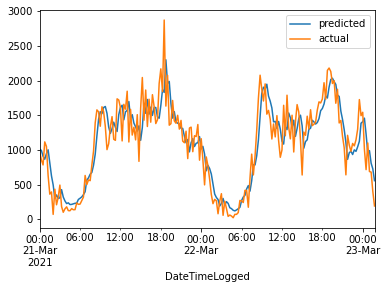

In [129]:
pred82.plot(label="predicted")
actual.plot(label="actual")
plt.legend(loc="best")
# plt.title('Location 82 predicted and actual values')

269.37700969457603


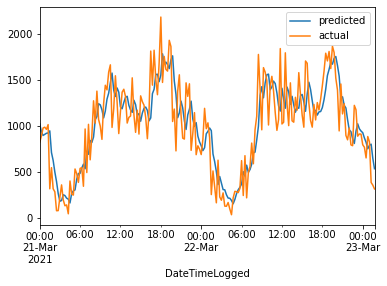

In [130]:
pickle.dump(predictions116, open("predictions_116.pickle", "wb"))
predictions_116 = pickle.load(open("predictions_116.pickle", "rb"))
error = np.sqrt(mean_squared_error(test116[:200], predictions_116))
print(error)
pred116 = pd.Series(predictions_116, index=test116[:200].index).apply(lambda x: x[0])
actual = test116[:200]
pred116.plot(label="predicted")
actual.plot(label="actual")
plt.legend(loc="best")
# plt.title('Location 82 predicted and actual values')

158.8182588852965


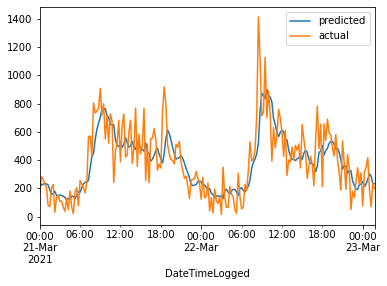

In [131]:
pickle.dump(predictions111, open("predictions_111.pickle", "wb"))
predictions_111 = pickle.load(open("predictions_111.pickle", "rb"))
error = np.sqrt(mean_squared_error(test111[:200], predictions_111))
print(error)
pred111 = pd.Series(predictions_111, index=test111[:200].index).apply(lambda x: x[0])
actual = test111[:200]
pred111.plot(label="predicted")
actual.plot(label="actual")
plt.legend(loc="best")
# plt.title('Location 82 predicted and actual values')

113.79473002735796


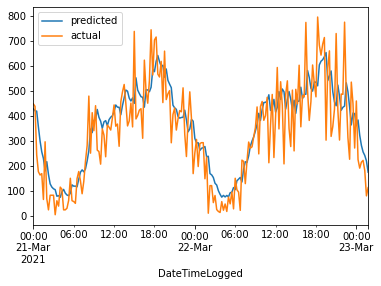

In [132]:
pickle.dump(predictions11, open("predictions_11.pickle", "wb"))
predictions_11 = pickle.load(open("predictions_11.pickle", "rb"))
error = np.sqrt(mean_squared_error(test11[:200], predictions_11))
print(error)
pred11 = pd.Series(predictions_11, index=test11[:200].index).apply(lambda x: x[0])
actual = test11[:200]
pred11.plot(label="predicted")
actual.plot(label="actual")
plt.legend(loc="best")
# plt.title('Location 82 predicted and actual values')

In [133]:
# Vanilla LSTM for time series